# Learn Trading Strategy - Features, EDA, Modelling and Trading

In [1]:
!pip install yfinance

# read files shared via google-drive-link
# https://stackoverflow.com/questions/62759748/downloading-data-from-a-shared-google-drive-link-in-google-colab

!pip uninstall gdown -y && pip install gdown
!gdown -V

Found existing installation: gdown 5.1.0
Uninstalling gdown-5.1.0:
  Successfully uninstalled gdown-5.1.0
gdown 5.2.0 at /usr/local/lib/python3.10/dist-packages


In [2]:
from datetime import date
import time

import numpy as np
import pandas as pd

# Fin Data Sources
import yfinance as yf
import pandas_datareader as pdr

# Data viz
import plotly.graph_objs as go
import plotly.graph_objects as go
import plotly.express as px

# for graphs
import matplotlib.pyplot as plt

# Imports form ML (Decision Trees)
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score

# Disable SettingWithCopyWarning
pd.options.mode.chained_assignment = None  # default='warn'

## Import dataset from GDrive

In [3]:
# https://stackoverflow.com/questions/62759748/downloading-data-from-a-shared-google-drive-link-in-google-colab
# truncated collected data: https://drive.google.com/file/d/1ZYeqbB_aD1iki-KYDgm0ERMgUUPhy3_K/view?usp=sharing
!gdown https://drive.google.com/file/d/1ZYeqbB_aD1iki-KYDgm0ERMgUUPhy3_K/view?usp=sharing --fuzzy -O /content/


Downloading...
From (original): https://drive.google.com/uc?id=1ZYeqbB_aD1iki-KYDgm0ERMgUUPhy3_K
From (redirected): https://drive.google.com/uc?id=1ZYeqbB_aD1iki-KYDgm0ERMgUUPhy3_K&confirm=t&uuid=64cd78e2-8294-47b3-87d4-d056316d966b
To: /content/stocks_df_combined_2024_07_08.parquet.brotli
100% 136M/136M [00:03<00:00, 42.1MB/s]


In [4]:
# full dataset for 43 stocks
df_full = pd.read_parquet("/content/stocks_df_combined_2024_07_08.parquet.brotli", )
df_full.info()

<class 'pandas.core.frame.DataFrame'>
Index: 262118 entries, 0 to 4379
Columns: 202 entries, Open to growth_btc_usd_365d
dtypes: datetime64[ns](3), float64(128), int32(64), int64(5), object(2)
memory usage: 342.0+ MB


In [5]:
df_full.keys()

Index(['Open', 'High', 'Low', 'Close', 'Adj Close_x', 'Volume', 'Ticker',
       'Year', 'Month', 'Weekday',
       ...
       'growth_brent_oil_7d', 'growth_brent_oil_30d', 'growth_brent_oil_90d',
       'growth_brent_oil_365d', 'growth_btc_usd_1d', 'growth_btc_usd_3d',
       'growth_btc_usd_7d', 'growth_btc_usd_30d', 'growth_btc_usd_90d',
       'growth_btc_usd_365d'],
      dtype='object', length=202)

## Prepare features

### Split features by groups

In [6]:
# growth indicators (but not future growth)
GROWTH = [g for g in df_full.keys() if (g.find('growth_')==0)&(g.find('future')<0)]
GROWTH

['growth_1d',
 'growth_3d',
 'growth_7d',
 'growth_30d',
 'growth_90d',
 'growth_365d',
 'growth_dax_1d',
 'growth_dax_3d',
 'growth_dax_7d',
 'growth_dax_30d',
 'growth_dax_90d',
 'growth_dax_365d',
 'growth_snp500_1d',
 'growth_snp500_3d',
 'growth_snp500_7d',
 'growth_snp500_30d',
 'growth_snp500_90d',
 'growth_snp500_365d',
 'growth_dji_1d',
 'growth_dji_3d',
 'growth_dji_7d',
 'growth_dji_30d',
 'growth_dji_90d',
 'growth_dji_365d',
 'growth_epi_1d',
 'growth_epi_3d',
 'growth_epi_7d',
 'growth_epi_30d',
 'growth_epi_90d',
 'growth_epi_365d',
 'growth_gold_1d',
 'growth_gold_3d',
 'growth_gold_7d',
 'growth_gold_30d',
 'growth_gold_90d',
 'growth_gold_365d',
 'growth_wti_oil_1d',
 'growth_wti_oil_3d',
 'growth_wti_oil_7d',
 'growth_wti_oil_30d',
 'growth_wti_oil_90d',
 'growth_wti_oil_365d',
 'growth_brent_oil_1d',
 'growth_brent_oil_3d',
 'growth_brent_oil_7d',
 'growth_brent_oil_30d',
 'growth_brent_oil_90d',
 'growth_brent_oil_365d',
 'growth_btc_usd_1d',
 'growth_btc_usd_3d',


In [7]:
# leaving only Volume ==> generate ln(Volume)
OHLCV = ['Open','High','Low','Close','Adj Close_x','Volume']

CATEGORICAL = ['Month', 'Weekday', 'Ticker', 'ticker_type']

In [8]:
TO_PREDICT = [g for g in df_full.keys() if (g.find('future')>=0)]
TO_PREDICT

['growth_future_5d', 'is_positive_growth_5d_future']

In [9]:
TO_DROP = ['Year','Date','index_x', 'index_y', 'index', 'Quarter','Adj Close_y'] + CATEGORICAL + OHLCV
TO_DROP

['Year',
 'Date',
 'index_x',
 'index_y',
 'index',
 'Quarter',
 'Adj Close_y',
 'Month',
 'Weekday',
 'Ticker',
 'ticker_type',
 'Open',
 'High',
 'Low',
 'Close',
 'Adj Close_x',
 'Volume']

In [10]:
# one more custom numerical feature
df_full['ln_volume'] = df_full.Volume.apply(lambda x: np.log(x))

In [11]:
# manually defined features
CUSTOM_NUMERICAL = ['SMA10', 'SMA20', 'growing_moving_average', 'high_minus_low_relative','volatility', 'ln_volume']

# All Supported Ta-lib indicators: https://github.com/TA-Lib/ta-lib-python/blob/master/docs/funcs.md

TECHNICAL_INDICATORS = ['adx', 'adxr', 'apo', 'aroon_1','aroon_2', 'aroonosc',
 'bop', 'cci', 'cmo','dx', 'macd', 'macdsignal', 'macdhist', 'macd_ext',
 'macdsignal_ext', 'macdhist_ext', 'macd_fix', 'macdsignal_fix',
 'macdhist_fix', 'mfi', 'minus_di', 'mom', 'plus_di', 'dm', 'ppo',
 'roc', 'rocp', 'rocr', 'rocr100', 'rsi', 'slowk', 'slowd', 'fastk',
 'fastd', 'fastk_rsi', 'fastd_rsi', 'trix', 'ultosc', 'willr',
 'ad', 'adosc', 'obv', 'atr', 'natr', 'ht_dcperiod', 'ht_dcphase',
 'ht_phasor_inphase', 'ht_phasor_quadrature', 'ht_sine_sine', 'ht_sine_leadsine',
 'ht_trendmod', 'avgprice', 'medprice', 'typprice', 'wclprice']


TECHNICAL_PATTERNS = [g for g in df_full.keys() if g.find('cdl')>=0]
print(f'Technical patterns count = {len(TECHNICAL_PATTERNS)}, examples = {TECHNICAL_PATTERNS[0:5]}')


Technical patterns count = 61, examples = ['cdl2crows', 'cdl3blackrows', 'cdl3inside', 'cdl3linestrike', 'cdl3outside']


In [12]:
MACRO = ['gdppot_us_yoy', 'gdppot_us_qoq', 'cpi_core_yoy', 'cpi_core_mom', 'FEDFUNDS', 'DGS1', 'DGS5', 'DGS10']

NUMERICAL = GROWTH + TECHNICAL_INDICATORS + TECHNICAL_PATTERNS + CUSTOM_NUMERICAL + MACRO

# CHECK: NO OTHER INDICATORS LEFT
OTHER = [k for k in df_full.keys() if k not in OHLCV + CATEGORICAL + NUMERICAL + TO_DROP]
OTHER

['growth_future_5d', 'is_positive_growth_5d_future']

In [13]:
df_full["Ticker"].nunique()

43

In [14]:
# tickers, min-max date, count of daily observations
df_full.groupby(['Ticker'])['Date'].agg(['min','max','count'])

,min,max,count
Ticker,,,
0941.HK,2000-01-04,2024-07-08,6115
1398.HK,2006-10-27,2024-07-08,4360
600519.SS,2001-08-27,2024-07-08,5633
601288.SS,2010-07-15,2024-07-08,3394
601857.SS,2007-11-05,2024-07-08,4053
601939.SS,2007-09-25,2024-07-08,4077
601988.SS,2006-07-05,2024-07-08,4380
AAPL,1980-12-12,2024-07-05,10981
ACN,2001-07-19,2024-07-05,5776


In [15]:
# truncated df_full with last 25 years of data (and defined growth variables)
df = df_full[df_full.Date>='2000-01-01']
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 223651 entries, 3490 to 4379
Columns: 203 entries, Open to ln_volume
dtypes: datetime64[ns](3), float64(129), int32(64), int64(5), object(2)
memory usage: 293.5+ MB


In [16]:
# numerical features count and size:
df[NUMERICAL].info()

<class 'pandas.core.frame.DataFrame'>
Index: 223651 entries, 3490 to 4379
Columns: 184 entries, growth_1d to DGS10
dtypes: float64(121), int32(62), int64(1)
memory usage: 262.8 MB


### Generate dummies

In [17]:
# what are the categorical features?
CATEGORICAL

['Month', 'Weekday', 'Ticker', 'ticker_type']

Generate dummy vars for month, weekday and week of month

In [18]:
# dummy variables should be generated from string representation, not from Date and numeric variables
df.loc[:,'Month'] = df.Month.dt.strftime('%B')
df.loc[:,'Weekday'] = df.Weekday.astype(str)

In [19]:
# define week of month
df.loc[:,'wom'] = df.Date.apply(lambda d: (d.day-1)//7 + 1)

# convert to string
df.loc[:,'wom'] = df.loc[:,'wom'].astype(str)

# check values for week-of-month (should be between 1 and 5)
df.wom.value_counts()

wom
2    52546
3    51655
4    51311
1    50198
5    17941
Name: count, dtype: int64

In [20]:
df.loc[:,'month_wom'] = df.Month + '_w' + df.wom

# examples of encoding
df.month_wom.value_counts()[0:2]

month_wom
May_w2    4515
May_w3    4511
Name: count, dtype: int64

In [21]:
# del wom temp variable
del df['wom']

In [22]:
# add to categorical
CATEGORICAL.append('month_wom')
CATEGORICAL

['Month', 'Weekday', 'Ticker', 'ticker_type', 'month_wom']

In [23]:
# Generate dummy variables (type int32)
dummy_variables = pd.get_dummies(df[CATEGORICAL], dtype='int32')

# TODO 1: define more categorical features, e.g. all combinations for   (you'll see that September is actually an important dummy in one of the models)
dummy_variables.info()

<class 'pandas.core.frame.DataFrame'>
Index: 223651 entries, 3490 to 4379
Columns: 126 entries, Month_April to month_wom_September_w5
dtypes: int32(126)
memory usage: 109.2 MB


In [24]:
# get dummies names in a list
DUMMIES = dummy_variables.keys().to_list()

# Concatenate the dummy variables with the original DataFrame
df_with_dummies = pd.concat([df, dummy_variables], axis=1)

df_with_dummies[NUMERICAL+DUMMIES].info()

<class 'pandas.core.frame.DataFrame'>
Index: 223651 entries, 3490 to 4379
Columns: 310 entries, growth_1d to month_wom_September_w5
dtypes: float64(121), int32(188), int64(1)
memory usage: 370.3 MB


## Correlation analysis

first approximation of "important" variables correlated with all variables we want to predict (TO_PREDICT)

In [25]:
TO_PREDICT

['growth_future_5d', 'is_positive_growth_5d_future']

In [26]:
corr_is_positive_growth_5d_future = df_with_dummies[NUMERICAL+DUMMIES+TO_PREDICT].corr()['is_positive_growth_5d_future']

# create a dataframe for an easy way to sort
corr_is_positive_growth_5d_future_df = pd.DataFrame(corr_is_positive_growth_5d_future)

corr_is_positive_growth_5d_future_df.sort_values(by='is_positive_growth_5d_future').head(5)

,is_positive_growth_5d_future
ticker_type_CHINA,-0.036996
month_wom_September_w3,-0.033897
growth_brent_oil_90d,-0.029579
growth_3d,-0.029362
growth_wti_oil_90d,-0.028862


In [27]:
corr_is_positive_growth_5d_future_df.sort_values(by='is_positive_growth_5d_future').tail(10)

,is_positive_growth_5d_future
growth_btc_usd_7d,0.020398
month_wom_December_w4,0.021050
month_wom_March_w4,0.026110
month_wom_October_w5,0.026217
growth_btc_usd_30d,0.026436
growth_future_5d,0.669128
is_positive_growth_5d_future,1.000000
cdl3starsinsouth,NaN
cdlconcealbabyswall,NaN
cdlmathold,NaN


In [29]:
corr_growth_future_5d = df_with_dummies[NUMERICAL+DUMMIES+TO_PREDICT].corr()['growth_future_5d']
corr_growth_future_5d_df = pd.DataFrame(corr_growth_future_5d)
corr_growth_future_5d_df.sort_values(by='growth_future_5d').head(5)

,growth_future_5d
growth_3d,-0.051354
growth_7d,-0.049625
growth_brent_oil_365d,-0.039175
fastd,-0.038272
slowk,-0.038269


In [30]:
corr_growth_future_5d_df.sort_values(by='growth_future_5d').tail(10)

,growth_future_5d
growth_btc_usd_3d,0.026397
Month_October,0.027257
growth_btc_usd_7d,0.027721
month_wom_October_w5,0.029037
natr,0.037256
is_positive_growth_5d_future,0.669128
growth_future_5d,1.000000
cdl3starsinsouth,NaN
cdlconcealbabyswall,NaN
cdlmathold,NaN


Here can be seen a stronger correlation with BTC and some October (as well as March and December) data.

## Prepare data for modeling

### Temporal split of ~25 years of data by date

In [31]:
def temporal_split(df, min_date, max_date, train_prop=0.7, val_prop=0.15, test_prop=0.15):
    """
    Splits a DataFrame into three buckets based on the temporal order of the 'Date' column.

    Args:
        df (DataFrame): The DataFrame to split.
        min_date (str or Timestamp): Minimum date in the DataFrame.
        max_date (str or Timestamp): Maximum date in the DataFrame.
        train_prop (float): Proportion of data for training set (default: 0.6).
        val_prop (float): Proportion of data for validation set (default: 0.2).
        test_prop (float): Proportion of data for test set (default: 0.2).

    Returns:
        DataFrame: The input DataFrame with a new column 'split' indicating the split for each row.
    """
    # Define the date intervals
    train_end = min_date + pd.Timedelta(days=(max_date - min_date).days * train_prop)
    val_end = train_end + pd.Timedelta(days=(max_date - min_date).days * val_prop)

    # Assign split labels based on date ranges
    split_labels = []
    for date in df['Date']:
        if date <= train_end:
            split_labels.append('train')
        elif date <= val_end:
            split_labels.append('validation')
        else:
            split_labels.append('test')

    # Add 'split' column to the DataFrame
    df['split'] = split_labels

    return df

In [32]:
min_date_df = df_with_dummies.Date.min()
max_date_df = df_with_dummies.Date.max()

df_with_dummies = temporal_split(
    df_with_dummies,
    min_date = min_date_df,
    max_date = max_date_df
)

df_with_dummies['split'].value_counts() / len(df_with_dummies)


split
train         0.654305
test          0.174535
validation    0.171160
Name: count, dtype: float64

In [33]:
# remove the "segmentation" problem
# (warning message on df performance after many joins and data transformations)
new_df = df_with_dummies.copy()

new_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 223651 entries, 3490 to 4379
Columns: 331 entries, Open to split
dtypes: datetime64[ns](2), float64(129), int32(189), int64(5), object(6)
memory usage: 405.3+ MB


For one ticket ensure that distribution is meaningful, let's do that for a Chinese one as they are a bit negatively correlated with our feature to predict.

In [35]:
df_baba = new_df[new_df.Ticker=='BABA']

fig = px.line(df_baba, x="Date", y="Adj Close_x", title='BABA price')
fig.show()

In [42]:
# TRAIN / VALIDATION/ TEST split

df_baba_split = temporal_split(df_baba, df_baba["Date"].min(), df_baba["Date"].max())

# # Calculate the lengths of each split -- this is not temporal split, but based on the number of observations --> "classic" split with no shuffle
# total_length = len(df_baba)
# train_length = int(0.8 * total_length)
# val_length = int(0.1 * total_length)

# Split the data
# train_data = df_baba.iloc[:train_length]
# val_data = df_baba.iloc[train_length:train_length+val_length]
# test_data = df_baba.iloc[train_length+val_length:]

train_data = df_baba_split[df_baba_split["split"] == "train"]
val_data = df_baba_split[df_baba_split["split"] == "validation"]
test_data = df_baba_split[df_baba_split["split"] == "test"]

# Plot the data
fig = px.line(title='BABA Adj.Close price daily for three time intervals Train/Validation/Test')
fig.add_scatter(x=train_data['Date'], y=train_data['Adj Close_x'], mode='lines', name='Train', line=dict(color='blue'))
fig.add_scatter(x=val_data['Date'], y=val_data['Adj Close_x'], mode='lines', name='Validation', line=dict(color='orange'))
fig.add_scatter(x=test_data['Date'], y=test_data['Adj Close_x'], mode='lines', name='Test', line=dict(color='green'))

# Update layout to center the title
fig.update_layout(title=dict(x=0.5))

fig.show()

In [43]:
# HIST ON BABA DATA Train/Test/Validation
# Plot the data
fig = go.Figure()

# Add histograms for each split
fig.add_trace(go.Histogram(x=train_data['growth_future_5d'], name='Train', opacity=0.75))
fig.add_trace(go.Histogram(x=val_data['growth_future_5d'], name='Validation', opacity=0.75))
fig.add_trace(go.Histogram(x=test_data['growth_future_5d'], name='Test', opacity=0.75))

fig.update_layout(barmode='overlay', title='Distribution of growth_future_5d for Alibaba (BABA) Growth by Train/Valid/Test sets')
fig.update_traces(opacity=0.75)

fig.show()

In [39]:
# HIST ON ALL DATA Train/Test/Validation
# comment: there are some outliers and hard co compare the distributions

# Plot the data
fig = go.Figure()

# Add histograms for each split
fig.add_trace(go.Histogram(x=df_with_dummies[df_with_dummies.split=='train']['growth_future_5d'], name='Train', opacity=0.75))
fig.add_trace(go.Histogram(x=df_with_dummies[df_with_dummies.split=='validation']['growth_future_5d'], name='Validation', opacity=0.75))
fig.add_trace(go.Histogram(x=df_with_dummies[df_with_dummies.split=='test']['growth_future_5d'], name='Test', opacity=0.75))

fig.update_layout(barmode='overlay', title='Distribution of growth_future_5d for All tickers Growth by Train/Valid/Test sets')
fig.update_traces(opacity=0.75)

fig.show()

In [40]:
# Assuming df_with_dummies is your DataFrame containing the 'growth_future_5d' variable and 'split' column

# Create the histogram
fig = px.histogram(
    new_df,
    x="growth_future_5d",
    color="split",
    marginal="box", # or violin, rug
)
#  hover_data=new_df.growth_future_5d)

# Show the histogram
fig.show()


## Modeling

### Data overview

In [ ]:
new_df.head(1)

,Open,High,Low,Close,Adj Close_x,Volume,Ticker,Year,Month,Weekday,...,Ticker_SIE.DE,Ticker_TCEHY,Ticker_TCS.NS,Ticker_TTE,Ticker_V,ticker_type_CHINA,ticker_type_EU,ticker_type_INDIA,ticker_type_US,split
3490,58.6875,59.3125,56.0,58.28125,36.000633,53228400.0,MSFT,2000,January,0,...,0,0,0,0,0,0,0,0,1,train


In [ ]:
# time split on train/validation/test: FIXED dates of split, approx. 70%, 15%, 15% split
new_df.groupby(['split'])['Date'].agg({'min','max','count'})

,max,min,count
split,,,
test,2024-07-08,2020-11-04,39035
train,2017-03-01,2000-01-03,146336
validation,2020-11-03,2017-03-02,38280


In [ ]:
# what do we try to predict
new_df[TO_PREDICT].head(1)

,growth_future_5d,is_positive_growth_5d_future
3490,0.963003,0


In [ ]:
# to be used as features
new_df[NUMERICAL+DUMMIES].head(1)

,growth_1d,growth_3d,growth_7d,growth_30d,growth_90d,growth_365d,growth_dax_1d,growth_dax_3d,growth_dax_7d,growth_dax_30d,...,Ticker_SBIN.NS,Ticker_SIE.DE,Ticker_TCEHY,Ticker_TCS.NS,Ticker_TTE,Ticker_V,ticker_type_CHINA,ticker_type_EU,ticker_type_INDIA,ticker_type_US
3490,0.998394,0.988341,0.991494,1.372333,1.222951,2.063053,0.970196,0.983855,1.051736,1.134572,...,0,0,0,0,0,0,0,0,0,1


### Define and clean dataframes for Modeling

In [44]:
# Features to be used in predictions (incl. new dummies)
features_list = NUMERICAL + DUMMIES

# What to predict
to_predict = 'is_positive_growth_5d_future'

train_df = new_df[new_df.split.isin(['train'])].copy(deep=True)
valid_df = new_df[new_df.split.isin(['validation'])].copy(deep=True)
train_valid_df = new_df[new_df.split.isin(['train','validation'])].copy(deep=True)

test_df =  new_df[new_df.split.isin(['test'])].copy(deep=True)

# ONLY numerical separate features (incl. dummies) and target variable for training and testing sets
X_train = train_df[features_list+[to_predict]]
X_valid = valid_df[features_list+[to_predict]]

X_train_valid = train_valid_df[features_list+[to_predict]]

X_test = test_df[features_list+[to_predict]]

# this to be used for predictions and join to the original dataframe new_df
X_all =  new_df[features_list+[to_predict]].copy(deep=True)

print(f'length: X_train {X_train.shape},  X_validation {X_valid.shape}, X_test {X_test.shape}, X_train_valid = {X_train_valid.shape},  all combined: X_all {X_all.shape}')


length: X_train (146336, 311),  X_validation (38280, 311), X_test (39035, 311), X_train_valid = (184616, 311),  all combined: X_all (223651, 311)


In [45]:
# Prepare a dataframe for ML
def clean_dataframe_from_inf_and_nan(df:pd.DataFrame):
    """Convert +-inf to NaN, all NaNs to 0s"""
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.fillna(0, inplace=True)
    return df

In [46]:
# Clean data to remove +-inf and NaNs

X_train = clean_dataframe_from_inf_and_nan(X_train)
X_valid = clean_dataframe_from_inf_and_nan(X_valid)
X_train_valid = clean_dataframe_from_inf_and_nan(X_train_valid)
X_test = clean_dataframe_from_inf_and_nan(X_test)
X_all = clean_dataframe_from_inf_and_nan(X_all)

y_train = X_train[to_predict]
y_valid = X_valid[to_predict]
y_train_valid = X_train_valid[to_predict]
y_test = X_test[to_predict]
y_all =  X_all[to_predict]

# remove y_train, y_test from X_ dataframes
del X_train[to_predict]
del X_valid[to_predict]
del X_train_valid[to_predict]

del X_test[to_predict]
del X_all[to_predict]


### Manual 'rule of thumb' predictions

Formulate and validate several "manual" hypotheses to predict the target feature:

* (pred0) CCI>200 (binary, on technical indicator CCI)
* (pred1) growth_1d>1
* (pred2) (growth_1d>1) & (growth_snp500_1d>1)
* (pred3) (gdppot_us_yoy <= 0.027) & (fastd >= 0.251)
* (pred4) (gdppot_us_yoy >= 0.027) & (growth_wti_oil_30d <= 1.005)

In [47]:
# Label all prediction features with prefix "pred"
new_df['pred0_manual_cci'] = (new_df.cci>200).astype(int)
new_df['pred1_manual_prev_g1'] = (new_df.growth_1d>1).astype(int)
new_df['pred2_manual_prev_g1_and_snp'] = ((new_df['growth_1d'] > 1) & (new_df['growth_snp500_1d'] > 1)).astype(int)
new_df['pred3_manual_gdp_and_fastd'] = ((new_df['gdppot_us_yoy'] <= 0.027) & (new_df['fastd'] >=0.251)).astype(int)
new_df['pred4_manual_gdp_and_wti30d'] = ((new_df['gdppot_us_yoy'] >= 0.027) & (new_df['growth_wti_oil_30d'] <= 1.005)).astype(int)

new_df[['cci','growth_1d','growth_snp500_1d','pred0_manual_cci','pred1_manual_prev_g1','pred2_manual_prev_g1_and_snp','pred3_manual_gdp_and_fastd','pred4_manual_gdp_and_wti30d','is_positive_growth_5d_future']]



,cci,growth_1d,growth_snp500_1d,pred0_manual_cci,pred1_manual_prev_g1,pred2_manual_prev_g1_and_snp,pred3_manual_gdp_and_fastd,pred4_manual_gdp_and_wti30d,is_positive_growth_5d_future
3490,26.847237,0.998394,0.990451,0,0,0,0,0,0
3491,-34.319663,0.966220,0.961655,0,0,0,0,0,0
3492,-97.318008,1.010543,1.001922,0,1,1,0,0,0
3493,-169.947507,0.966502,1.000956,0,0,0,0,0,0
3494,-142.142685,1.013068,1.027090,0,1,1,0,0,1
...,...,...,...,...,...,...,...,...,...
4375,182.888672,1.019272,1.006195,0,1,1,1,0,0
4376,140.749614,0.989496,1.005084,0,0,0,1,0,0
4377,117.252825,1.006369,NaN,0,1,0,1,0,0
4378,104.899466,1.000000,1.005449,0,0,0,1,0,0


In [48]:
def get_predictions_correctness(df:pd.DataFrame, to_predict:str):
    """Find all predictions (starting from 'pred'), generate is_correct (correctness of each prediction)
        and precision on TEST dataset (assuming there is df["split"] column with values 'train','validation','test'

    Returns:
        2 lists of features: PREDICTIONS and IS_CORRECT
    """
    PREDICTIONS = [k for k in df.keys() if k.startswith('pred')]
    print(f'Prediction columns founded: {PREDICTIONS}')

  # add columns is_correct_
    for pred in PREDICTIONS:
        part1 = pred.split('_')[0] # first prefix before '_'
        df[f'is_correct_{part1}'] =  (new_df[pred] == new_df[to_predict]).astype(int)

    # IS_CORRECT features set
    IS_CORRECT =  [k for k in df.keys() if k.startswith('is_correct_')]
    print(f'Created columns is_correct: {IS_CORRECT}')

    print('Precision on TEST set for each prediction:')
    # define "Precision" for ALL predictions on a Test dataset (~4 last years of trading)
    for i,column in enumerate(IS_CORRECT):
        prediction_column = PREDICTIONS[i]
        is_correct_column = column
        filter = (new_df.split=='test') & (new_df[prediction_column]==1)
        print(f'Prediction column:{prediction_column} , is_correct_column: {is_correct_column}')
        print(new_df[filter][is_correct_column].value_counts())
        print(new_df[filter][is_correct_column].value_counts()/len(new_df[filter]))
        print('---------')

    return PREDICTIONS, IS_CORRECT

PREDICTIONS, IS_CORRECT = get_predictions_correctness(new_df, to_predict='is_positive_growth_5d_future')


Prediction columns founded: ['pred0_manual_cci', 'pred1_manual_prev_g1', 'pred2_manual_prev_g1_and_snp', 'pred3_manual_gdp_and_fastd', 'pred4_manual_gdp_and_wti30d']
Created columns is_correct: ['is_correct_pred0', 'is_correct_pred1', 'is_correct_pred2', 'is_correct_pred3', 'is_correct_pred4']
Precision on TEST set for each prediction:
Prediction column:pred0_manual_cci , is_correct_column: is_correct_pred0
is_correct_pred0
1    606
0    483
Name: count, dtype: int64
is_correct_pred0
1    0.556474
0    0.443526
Name: count, dtype: float64
---------
Prediction column:pred1_manual_prev_g1 , is_correct_column: is_correct_pred1
is_correct_pred1
1    10682
0     9167
Name: count, dtype: int64
is_correct_pred1
1    0.538163
0    0.461837
Name: count, dtype: float64
---------
Prediction column:pred2_manual_prev_g1_and_snp , is_correct_column: is_correct_pred2
is_correct_pred2
1    6857
0    5887
Name: count, dtype: int64
is_correct_pred2
1    0.538057
0    0.461943
Name: count, dtype: float64

In [49]:
new_df[PREDICTIONS+IS_CORRECT+['is_positive_growth_5d_future']]

,pred0_manual_cci,pred1_manual_prev_g1,pred2_manual_prev_g1_and_snp,pred3_manual_gdp_and_fastd,pred4_manual_gdp_and_wti30d,is_correct_pred0,is_correct_pred1,is_correct_pred2,is_correct_pred3,is_correct_pred4,is_positive_growth_5d_future
3490,0,0,0,0,0,1,1,1,1,1,0
3491,0,0,0,0,0,1,1,1,1,1,0
3492,0,1,1,0,0,1,0,0,1,1,0
3493,0,0,0,0,0,1,1,1,1,1,0
3494,0,1,1,0,0,0,1,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
4375,0,1,1,1,0,1,0,0,0,1,0
4376,0,0,0,1,0,1,1,1,0,1,0
4377,0,1,0,1,0,1,0,1,0,1,0
4378,0,0,0,1,0,1,1,1,0,1,0


In [ ]:
len(new_df[new_df.split=='test'])

39035

In [50]:
# pred4 seems to be empty on Test - let's check why?

# it used to be some stats
new_df[(new_df['gdppot_us_yoy'] >= 0.027) & (new_df['growth_wti_oil_30d'] <= 1.005)]

,Open,High,Low,Close,Adj Close_x,Volume,Ticker,Year,Month,Weekday,...,pred0_manual_cci,pred1_manual_prev_g1,pred2_manual_prev_g1_and_snp,pred3_manual_gdp_and_fastd,pred4_manual_gdp_and_wti30d,is_correct_pred0,is_correct_pred1,is_correct_pred2,is_correct_pred3,is_correct_pred4
3682,27.750000,28.625000,27.62500,27.687500,17.102713,81099400.0,MSFT,2000,October,3,...,0,0,0,0,1,1,1,1,1,0
3683,27.906250,28.375000,27.37500,27.781250,17.160631,61794000.0,MSFT,2000,October,4,...,0,1,0,0,1,1,0,1,1,0
3684,27.812500,27.875000,26.50000,27.093750,16.735958,58323600.0,MSFT,2000,October,0,...,0,0,0,0,1,1,1,1,1,0
3689,26.750000,26.906250,24.78125,25.187500,15.558451,119759000.0,MSFT,2000,October,0,...,0,0,0,0,1,0,0,0,0,1
3690,25.937500,26.218750,25.12500,25.218750,15.577755,81276600.0,MSFT,2000,October,1,...,0,1,0,0,1,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
651,22.549999,23.000000,22.50000,22.850000,9.723148,20854978.0,0941.HK,2002,July,2,...,0,1,1,0,1,0,1,1,0,1
654,23.799999,23.799999,23.40000,23.549999,10.021008,25502960.0,0941.HK,2002,July,0,...,0,1,0,0,1,1,0,1,1,0
655,23.500000,23.650000,23.35000,23.450001,9.978461,11813544.0,0941.HK,2002,July,1,...,0,0,0,0,1,1,1,1,1,0
676,21.150000,21.400000,21.00000,21.350000,9.084865,14728296.0,0941.HK,2002,August,2,...,0,1,1,0,1,0,1,1,0,1


In [51]:
# but no positive cases in TEST
new_df[(new_df['gdppot_us_yoy'] >= 0.027) & (new_df['growth_wti_oil_30d'] <= 1.005) & (new_df.split=='test')]


,Open,High,Low,Close,Adj Close_x,Volume,Ticker,Year,Month,Weekday,...,pred0_manual_cci,pred1_manual_prev_g1,pred2_manual_prev_g1_and_snp,pred3_manual_gdp_and_fastd,pred4_manual_gdp_and_wti30d,is_correct_pred0,is_correct_pred1,is_correct_pred2,is_correct_pred3,is_correct_pred4


<Axes: xlabel='Date'>

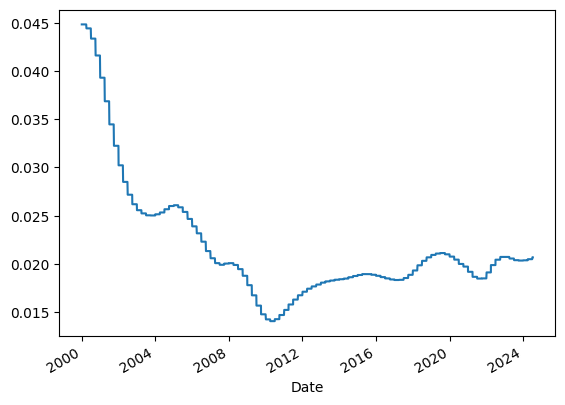

In [52]:
# let's debug and see what happens with indicators --> US GDP POT seems to be growing lower than 2.5% in the last 10 years
# check in the original datasource, and make sure we didn't mess up with data transformations https://fred.stlouisfed.org/series/GDPPOT (click 'Edit Graph' and select 'Percent Change from One Year Ago')
new_df.groupby('Date')['gdppot_us_yoy'].max().plot.line()

### Decision Tree Classifier

In [53]:
# Estimation/fit function (using dataframe of features X and what to predict y) --> optimising total accuracy
# max_depth is hyperParameter
def fit_decision_tree(X, y, max_depth=20):
# Initialize the Decision Tree Classifier
    clf = DecisionTreeClassifier(
      max_depth=max_depth,
      random_state=42
    )

    # Fit the classifier to the training data
    clf.fit(X, y)
    return clf, X.columns



In [54]:
# fit decision tree
%%time
clf_10, train_columns = fit_decision_tree(
    X=X_train_valid,
    y=y_train_valid,
    max_depth=10
)

CPU times: user 30 s, sys: 337 ms, total: 30.4 s
Wall time: 32.6 s


In [55]:
# predict and estimate correctness

# predict on a full dataset
y_pred_all = clf_10.predict(X_all)

# defining a new prediction vector is easy now, as the dimensions will match
new_df['pred5_clf_10'] = y_pred_all

# new prediction is added --> need to recalculate the correctness
PREDICTIONS, IS_CORRECT = get_predictions_correctness(df = new_df, to_predict = to_predict)


Prediction columns founded: ['pred0_manual_cci', 'pred1_manual_prev_g1', 'pred2_manual_prev_g1_and_snp', 'pred3_manual_gdp_and_fastd', 'pred4_manual_gdp_and_wti30d', 'pred5_clf_10']
Created columns is_correct: ['is_correct_pred0', 'is_correct_pred1', 'is_correct_pred2', 'is_correct_pred3', 'is_correct_pred4', 'is_correct_pred5']
Precision on TEST set for each prediction:
Prediction column:pred0_manual_cci , is_correct_column: is_correct_pred0
is_correct_pred0
1    606
0    483
Name: count, dtype: int64
is_correct_pred0
1    0.556474
0    0.443526
Name: count, dtype: float64
---------
Prediction column:pred1_manual_prev_g1 , is_correct_column: is_correct_pred1
is_correct_pred1
1    10682
0     9167
Name: count, dtype: int64
is_correct_pred1
1    0.538163
0    0.461837
Name: count, dtype: float64
---------
Prediction column:pred2_manual_prev_g1_and_snp , is_correct_column: is_correct_pred2
is_correct_pred2
1    6857
0    5887
Name: count, dtype: int64
is_correct_pred2
1    0.538057
0    

Looks like DecisionTree is more correct than any "manual" predictor

#### Hyperparams tuning for a Decision Tree Classifier

In [67]:
# visualisation: decision tree for a few levels (max_depth variable)
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# https://stackoverflow.com/questions/20156951/how-do-i-find-which-attributes-my-tree-splits-on-when-using-scikit-learn
from sklearn.tree import export_text

In [68]:
%%time
# hyper params tuning for a Decision Tree

precision_by_depth = {}
best_precision = 0
best_depth = 0

for depth in range(1,21):
    print(f'Working with a tree of a max depth= {depth}')
    # fitting the tree on X_train, y_train
    # apply custom hyperparam
    clf,train_columns = fit_decision_tree(
        X=X_train_valid,
        y=y_train_valid,
        max_depth=depth
    )

    # getting the predictions for TEST and accuracy score
    y_pred_valid = clf.predict(X_valid)
    precision_valid = precision_score(y_valid, y_pred_valid)
    y_pred_test = clf.predict(X_test)
    precision_test = precision_score(y_test, y_pred_test)
    print(f'  Precision on test is {precision_test}, (precision on valid is {precision_valid} - tend to overfit)')

    # saving to the dict
    precision_by_depth[depth] = round(precision_test,4)

    # updating the best precision
    if precision_test >= best_precision:
        best_precision = round(precision_test,4)
        best_depth = depth
    # plot tree - long
    # plt.figure(figsize=(20,10))  # Set the size of the figure
    # plot_tree(clf,
    #           filled=True,
    #           feature_names=train_columns,
    #           class_names=['Negative', 'Positive'],
    #           max_depth=2)
    # plt.show()
    # plot tree - short
    tree_rules = export_text(clf, feature_names=list(X_train), max_depth=3)
    print(tree_rules)
    print('------------------------------')

print(f'All precisions by depth: {precision_by_depth}')
print(f'The best precision is {best_precision} and the best depth is {best_depth} ')

Working with a tree of a max depth= 1
  Precision on test is 0.541642116049699, (precision on valid is 0.5555120167189133 - tend to overfit)
|--- gdppot_us_yoy <= 0.03
|   |--- class: 1
|--- gdppot_us_yoy >  0.03
|   |--- class: 0

------------------------------
Working with a tree of a max depth= 2
  Precision on test is 0.5413211470822316, (precision on valid is 0.5570147511408257 - tend to overfit)
|--- gdppot_us_yoy <= 0.03
|   |--- growth_gold_365d <= 1.51
|   |   |--- class: 1
|   |--- growth_gold_365d >  1.51
|   |   |--- class: 0
|--- gdppot_us_yoy >  0.03
|   |--- growth_wti_oil_30d <= 1.00
|   |   |--- class: 1
|   |--- growth_wti_oil_30d >  1.00
|   |   |--- class: 0

------------------------------
Working with a tree of a max depth= 3
  Precision on test is 0.5413831180503839, (precision on valid is 0.5573961057832025 - tend to overfit)
|--- gdppot_us_yoy <= 0.03
|   |--- growth_gold_365d <= 1.51
|   |   |--- slowd <= 1.07
|   |   |   |--- class: 0
|   |   |--- slowd >  1.0

In [69]:
# Results of Hyper parameters tuning for a Decision Tree
print(precision_by_depth)

{1: 0.5416, 2: 0.5413, 3: 0.5414, 4: 0.5414, 5: 0.5467, 6: 0.5466, 7: 0.5593, 8: 0.5514, 9: 0.554, 10: 0.5576, 11: 0.5546, 12: 0.5559, 13: 0.5571, 14: 0.5564, 15: 0.5474, 16: 0.5438, 17: 0.5394, 18: 0.5435, 19: 0.5418, 20: 0.548}


In [70]:
# # pre-calculated results
# precision_by_depth = {
#     1: 0.5416,
#     2: 0.5413,
#     3: 0.5414,
#     4: 0.5414,
#     5: 0.5467,
#     6: 0.5466,
#     7: 0.5593,
#     8: 0.5514,
#     9: 0.554,
#     10: 0.5576,
#     11: 0.5546,
#     12: 0.5559,
#     13: 0.5571,
#     14: 0.5564,
#     15: 0.5474,
#     16: 0.5438,
#     17: 0.5394,
#     18: 0.5435,
#     19: 0.5418,
#     20: 0.548
# }


In [73]:
best_depth = max(precision_by_depth, key=precision_by_depth.get)
best_precision = precision_by_depth[best_depth]

print(f'Best precision and depth = {best_depth}, precision (on test)={best_precision}')

Best precision and depth = 7, precision (on test)=0.5593


In [75]:
# Visualize the tuning results

# Convert the dictionary to a DataFrame
df = pd.DataFrame(list(precision_by_depth.items()), columns=['max_depth', 'precision_score'])
df.loc[:,'precision_score'] = df.precision_score*100.0 # need for % visualisation

# Create the bar chart using Plotly Express
fig = px.bar(df,
             x='max_depth',
             y='precision_score',
             labels={'max_depth': 'Max Depth', 'precision_score': 'Precision Score'},
             range_y=[54, 60],
             text='precision_score')

# Update the text format to display as percentages
fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside')

# Center the title
fig.update_layout(title={'text': 'Precision Score vs. Max Depth for a Decision Tree', 'x': 0.5, 'xanchor': 'center'})


# Show the figure
fig.show()



Use found hyperparams for prediction. Depth=7 looks like an outlier, so calculate the model for 2nd and 3rd best results, too.

In [76]:
%%time
clf_best,train_columns = fit_decision_tree(
    X=X_train_valid,
    y=y_train_valid,
    max_depth=best_depth
)

CPU times: user 22.7 s, sys: 600 ms, total: 23.3 s
Wall time: 23.7 s


In [109]:
%%time
clf_best2,train_columns2 = fit_decision_tree(
    X=X_train_valid,
    y=y_train_valid,
    max_depth=10
)

CPU times: user 35.4 s, sys: 368 ms, total: 35.7 s
Wall time: 41.8 s


In [110]:
%%time
clf_best3,train_columns3 = fit_decision_tree(
    X=X_train_valid,
    y=y_train_valid,
    max_depth=13
)

CPU times: user 38.8 s, sys: 184 ms, total: 38.9 s
Wall time: 41 s


In [77]:
# For a DecisionTreeClassifier in scikit-learn, the concept of trainable parameters differs from that of neural networks.
# In decision trees, the parameters are the structure of the tree itself (nodes and splits) rather than weights.
# However, you can still get a sense of the model's complexity by looking at the number of nodes and leaves.

# Here's how you can get this information for your trained DecisionTreeClassifier (referred to as clf_best):

# Get the number of nodes and leaves in the tree
n_nodes = clf_best.tree_.node_count
n_leaves = clf_best.get_n_leaves()

print(f"Number of nodes: {n_nodes}")
print(f"Number of leaves: {n_leaves}")


Number of nodes: 229
Number of leaves: 115


In [78]:
clf_best


DecisionTreeClassifier(max_depth=7, random_state=42)

Predict on a full dataset and compare with other methods

In [79]:
# predict on a full dataset
y_pred_clf_best = clf_best.predict(X_all)

# defining a new prediction vector is easy now, as the dimensions will match
new_df['pred6_clf_best'] = y_pred_clf_best

# new prediction is added --> need to recalculate the correctness
PREDICTIONS, IS_CORRECT = get_predictions_correctness(new_df, to_predict='is_positive_growth_5d_future')


Prediction columns founded: ['pred0_manual_cci', 'pred1_manual_prev_g1', 'pred2_manual_prev_g1_and_snp', 'pred3_manual_gdp_and_fastd', 'pred4_manual_gdp_and_wti30d', 'pred5_clf_10', 'pred6_clf_best']
Created columns is_correct: ['is_correct_pred0', 'is_correct_pred1', 'is_correct_pred2', 'is_correct_pred3', 'is_correct_pred4', 'is_correct_pred5', 'is_correct_pred6']
Precision on TEST set for each prediction:
Prediction column:pred0_manual_cci , is_correct_column: is_correct_pred0
is_correct_pred0
1    606
0    483
Name: count, dtype: int64
is_correct_pred0
1    0.556474
0    0.443526
Name: count, dtype: float64
---------
Prediction column:pred1_manual_prev_g1 , is_correct_column: is_correct_pred1
is_correct_pred1
1    10682
0     9167
Name: count, dtype: int64
is_correct_pred1
1    0.538163
0    0.461837
Name: count, dtype: float64
---------
Prediction column:pred2_manual_prev_g1_and_snp , is_correct_column: is_correct_pred2
is_correct_pred2
1    6857
0    5887
Name: count, dtype: int6

#### Two ways of visualisation

In [80]:
# train a simple tree
%%time
clf_2,train_columns = fit_decision_tree(
    X=X_train_valid,
    y=y_train_valid,
    max_depth=2
)

CPU times: user 7.31 s, sys: 195 ms, total: 7.51 s
Wall time: 7.78 s


### Random Forest

In [88]:
from sklearn.ensemble import RandomForestClassifier

In [89]:
%%time
# hyperparams tuning

precision_matrix = {}
best_precision = 0
best_depth = 0
best_estimators = 1

# use a bit less params for tuning - to save time

for depth in [16, 18, 20]:
  for estimators in [50, 250, 500]:
    print(f'Working with HyperParams: depth = {depth}, estimators = {estimators}')

    # Start timing
    start_time = time.time()
    # fitting the tree on X_train, y_train
    rf = RandomForestClassifier(
        n_estimators = estimators,
        max_depth = depth,
        random_state = 42,
        n_jobs = -1
    )

    rf = rf.fit(X_train_valid, y_train_valid)

    # getting the predictions for TEST and accuracy score
    y_pred_valid = rf.predict(X_valid)
    precision_valid = precision_score(y_valid, y_pred_valid)
    y_pred_test = rf.predict(X_test)
    precision_test = precision_score(y_test, y_pred_test)
    print(f'  Precision on test is {precision_test}, (precision on valid is {precision_valid} - tend to overfit)')

    # saving to the dict
    precision_matrix[depth, estimators] = round(precision_test,4)

    # Measure elapsed time
    elapsed_time = time.time() - start_time
    print(f'Time for training: {elapsed_time:.2f} seconds, or {elapsed_time/60:.2f} minutes')

    # updating the best precision
    if precision_test >= best_precision:
        best_precision = round(precision_test,4)
        best_depth = depth
        best_estimators = estimators
        print(f'New best precision found for depth={depth}, estimators = {estimators}')

    print('------------------------------')

print(f'Matrix of precisions: {precision_matrix}')
print(f'The best precision is {best_precision} and the best depth is {best_depth} ')


Working with HyperParams: depth = 16, estimators = 50
  Precision on test is 0.5516341088162618, (precision on valid is 0.7929537421238666 - tend to overfit)
Time for training: 76.81 seconds, or 1.28 minutes
New best precision found for depth=16, estimators = 50
------------------------------
Working with HyperParams: depth = 16, estimators = 250
  Precision on test is 0.5496960144111687, (precision on valid is 0.7859637136567221 - tend to overfit)
Time for training: 365.27 seconds, or 6.09 minutes
------------------------------
Working with HyperParams: depth = 16, estimators = 500
  Precision on test is 0.5564720519791715, (precision on valid is 0.7879963486992241 - tend to overfit)
Time for training: 686.21 seconds, or 11.44 minutes
New best precision found for depth=16, estimators = 500
------------------------------
Working with HyperParams: depth = 18, estimators = 50
  Precision on test is 0.5555155497547144, (precision on valid is 0.8471394760466825 - tend to overfit)
Time for 

In [90]:
# pre-calculated best precision matrix (max_depth, n_estimators) for Random Forest
best_precision_matrix_random_forest = {(16, 50): 0.5516, (16, 250): 0.5497, (16, 500): 0.5565, (18, 50): 0.5555, (18, 250): 0.5558, (18, 500): 0.5599, (20, 50): 0.5501, (20, 250): 0.5583, (20, 500): 0.557}


In [91]:
# Convert data to DataFrame
df = pd.DataFrame.from_dict(best_precision_matrix_random_forest, orient='index', columns=['precision_score']).reset_index()

# Rename the columns for clarity
df.columns = ['max_depth_and_metric', 'precision_score']

# Separate the tuple into two columns
df[['max_depth', 'n_estimators']] = pd.DataFrame(df['max_depth_and_metric'].tolist(), index=df.index)

# Drop the combined column
df = df.drop(columns=['max_depth_and_metric'])

# Create line plot using Plotly Express
fig = px.line(df, x='max_depth', y='precision_score', color='n_estimators',
              labels={'max_depth': 'Max Depth', 'precision_score': 'Precision Score', 'n_estimators': 'Number of Estimators'},
              title='Random Forest Models: Precision Score vs. Max Depth for Different Number of Estimators')

# Adjust x-axis range
fig.update_xaxes(range=[15, 20])

# Show the figure
fig.show()


Predict with tuned params

In [92]:
%%time

rf_best = RandomForestClassifier(
    n_estimators = 500,
    max_depth = 18,
    random_state = 42,
    n_jobs = -1
)

rf_best = rf_best.fit(X_train_valid, y_train_valid)

CPU times: user 21min 3s, sys: 3.5 s, total: 21min 6s
Wall time: 12min 16s


### Logistic Regression with hyperparameter tuning

https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html

There can be many cases when Logistic Regression does not converge: https://forecastegy.com/posts/how-to-solve-logistic-regression-not-converging-in-scikit-learn/

In [82]:
from sklearn.linear_model import LogisticRegression

precision_matrix = {}
best_precision = 0
best_C = 0
best_iter = 0

for c in [1, 0.1, 0.01]:
    for iter in [50, 100, 200]:
        print(f'Working with HyperParams: C = {c} (positive float, smaller = stronger regularization), max_iter={iter}')
        # fitting the tree on X_train, y_train
        # hyperParam C should be between 0 and 1
        lr = LogisticRegression(
            C=c,
            random_state=42,
            max_iter=iter,
            solver='sag',
            n_jobs=-1
        )

        lr = lr.fit(X_train_valid, y_train_valid)

        # getting the predictions for TEST and accuracy score
        y_pred_valid = lr.predict(X_valid)
        precision_valid = precision_score(y_valid, y_pred_valid)
        y_pred_test = lr.predict(X_test)
        precision_test = precision_score(y_test, y_pred_test)
        print(f'  Precision on test is {precision_test}, (precision on valid is {precision_valid} - tend to overfit)')
        # saving to the dict
        precision_matrix[(c,iter)] = round(precision_test,4)
        # updating the best precision
        if precision_test >= best_precision:
            best_precision = round(precision_test,4)
            best_C = c
            best_iter = iter
            print(f'New best precision found for C={c}')
            print('------------------------------')

print(f'Matrix of precisions: {precision_matrix}')
print(f'The best precision is {best_precision} and the best C is {best_C}, best max_iter = {best_iter}  ')

print(precision_matrix)

Working with HyperParams: C = 1 (positive float, smaller = stronger regularization), max_iter=50


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



  Precision on test is 0.5434738955823293, (precision on valid is 0.5578283178477327 - tend to overfit)
New best precision found for C=1
------------------------------
Working with HyperParams: C = 1 (positive float, smaller = stronger regularization), max_iter=100
  Precision on test is 0.5434491531097275, (precision on valid is 0.5578396367039901 - tend to overfit)
Working with HyperParams: C = 1 (positive float, smaller = stronger regularization), max_iter=200
  Precision on test is 0.5434491531097275, (precision on valid is 0.5578396367039901 - tend to overfit)
Working with HyperParams: C = 0.1 (positive float, smaller = stronger regularization), max_iter=50


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



  Precision on test is 0.5434738955823293, (precision on valid is 0.5578283178477327 - tend to overfit)
Working with HyperParams: C = 0.1 (positive float, smaller = stronger regularization), max_iter=100
  Precision on test is 0.5434491531097275, (precision on valid is 0.5578396367039901 - tend to overfit)
Working with HyperParams: C = 0.1 (positive float, smaller = stronger regularization), max_iter=200
  Precision on test is 0.5434491531097275, (precision on valid is 0.5578396367039901 - tend to overfit)
Working with HyperParams: C = 0.01 (positive float, smaller = stronger regularization), max_iter=50


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



  Precision on test is 0.5434738955823293, (precision on valid is 0.5578283178477327 - tend to overfit)
Working with HyperParams: C = 0.01 (positive float, smaller = stronger regularization), max_iter=100
  Precision on test is 0.5434491531097275, (precision on valid is 0.5578396367039901 - tend to overfit)
Working with HyperParams: C = 0.01 (positive float, smaller = stronger regularization), max_iter=200
  Precision on test is 0.5434491531097275, (precision on valid is 0.5578396367039901 - tend to overfit)
Matrix of precisions: {(1, 50): 0.5435, (1, 100): 0.5434, (1, 200): 0.5434, (0.1, 50): 0.5435, (0.1, 100): 0.5434, (0.1, 200): 0.5434, (0.01, 50): 0.5435, (0.01, 100): 0.5434, (0.01, 200): 0.5434}
The best precision is 0.5435 and the best C is 1, best max_iter = 50  
{(1, 50): 0.5435, (1, 100): 0.5434, (1, 200): 0.5434, (0.1, 50): 0.5435, (0.1, 100): 0.5434, (0.1, 200): 0.5434, (0.01, 50): 0.5435, (0.01, 100): 0.5434, (0.01, 200): 0.5434}


In [83]:
# keys are tuples (C, iter)
best_precision_matrix_logistic_regression = {(1, 50): 0.5435, (1, 100): 0.5434, (1, 200): 0.5434, (0.1, 50): 0.5435, (0.1, 100): 0.5434, (0.1, 200): 0.5434, (0.01, 50): 0.5435, (0.01, 100): 0.5434, (0.01, 200): 0.5434}

list(best_precision_matrix_logistic_regression.items())[0]


((1, 50), 0.5435)

In [93]:
%%time

lr_best = LogisticRegression(
    C=1,
    random_state=42,
    max_iter=50,
    solver='sag',
    n_jobs=-1
)

lr_best = lr_best.fit(X_train_valid, y_train_valid)

CPU times: user 49.3 s, sys: 756 ms, total: 50.1 s
Wall time: 51.3 s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



Visualize precision score

In [84]:
# Prepare the data
rows = []
for key, value in list(best_precision_matrix_logistic_regression.items()):
    C, max_iter = key
    combination_label = f'C={C}, max_iter={max_iter}'
    rows.append({'Combination': combination_label, 'Precision': value})

df = pd.DataFrame(rows)
df.loc[:,'Precision'] = df.Precision*100.0 # need for % visualisation

# Create the bar chart
fig = px.bar(df,
             x='Combination',
             y='Precision',
             text='Precision'
             )

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hyperparams combinations of ',
    yaxis_title='Precision Score',
    xaxis_tickangle=-45,
    title={
        'text': 'Precision Scores for Various Logistic Regression Hyperparameter Combinations',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)

# Update the text position
fig.update_traces(texttemplate='%{text:.2f}%',
                  textposition='inside',
                  textfont_color='white')

# Show the figure
fig.show()

## Different Decision rules to improve precision (varying threshold)

* best model1 (clf_best3): Decision Tree (max_depth=13) - take this one instead of clf_best because clf_best does not have a good threshold and precision
* best model2 (rf_best): Random Forest (n_estimators=500, max_depth=18)


### Predicting probabilities (predict_proba), getting the distribution for probabilities, and new decision rules

Here we account for probabilities of some class instead of label. We get this probability and compare it with a threshold, assume that actual growth (and "buy" event) happens only when predicted probability is more that this very threshold.

On the other hand, the model can set a high probability to an event, but actually it may not be true. That's why we are interested in cases when higher thresholds are accompanied with high accuracies.  

In [94]:
import seaborn as sns

#### For DecisionTree

In [145]:
# y_pred_test = best_lr.predict_proba(X_test)

# predicting probability instead of a label
y_pred_test = clf_best3.predict_proba(X_test)
y_pred_test


array([[0.4613884 , 0.5386116 ],
       [1.        , 0.        ],
       [0.90697674, 0.09302326],
       ...,
       [0.83333333, 0.16666667],
       [0.79668675, 0.20331325],
       [0.79668675, 0.20331325]])

There are two classes - class 0 means no growth, class 1 means growth. Estimate cases when a growth is predicted.

In [146]:
# k[1] is the second element in the list of Class predictions
y_pred_test_class1 = [k[1] for k in y_pred_test]

In [147]:
y_pred_test_class1_df = pd.DataFrame(y_pred_test_class1, columns=['Class1_probability'])
y_pred_test_class1_df.head()

,Class1_probability
0,0.538612
1,0.000000
2,0.093023
3,0.538612
4,0.538612


In [149]:
# Mean prediction is 0.50, median is 0.54, 75% quantile is 0.61
y_pred_test_class1_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Class1_probability,39035.0,0.502916,0.234516,0.0,0.398072,0.538612,0.607789,1.0


In [156]:
# Unconditional probability of a positive growth is 54.16%
y_test.sum()/y_test.count()

0.541642116049699

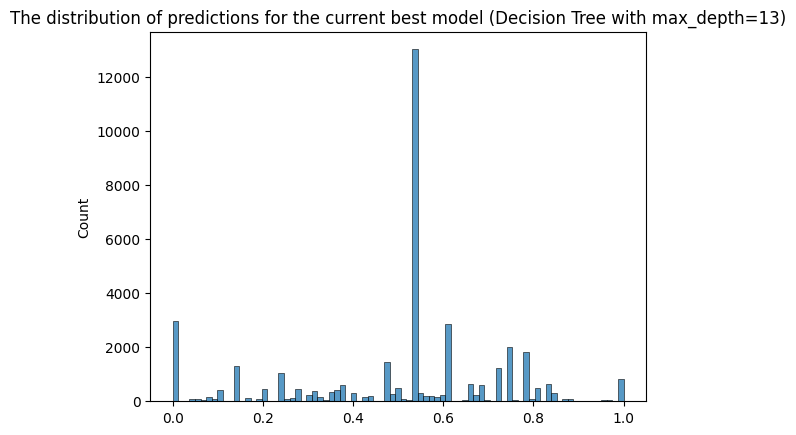

In [155]:
sns.histplot(y_pred_test_class1)

# Add a title
plt.title('The distribution of predictions for the current best model (Decision Tree with max_depth=13)')

# Show the plot
plt.show()

In [152]:
def tpr_fpr_dataframe(y_true, y_pred, only_even=False):
    """ Create tpr (True Positive Rate) vs. fpr (False Positive Rate) dataframe
    * tp = True Positive
    * tn = True Negative
    * fp = False Positive
    * fn = False Negative

    Decision Rule :  "y_pred>= Threshold" for Class "1"

    when only_even=True --> we'll have a step ==0.02 and leave only even records
    """

    scores = []

    if not only_even:
        thresholds = np.linspace(0, 1, 101) #[0, 0.01, 0.02, ...0.99,1.0]
    else:
        thresholds = np.linspace(0, 1, 51) #[0, 0.02, 0.04,  ...0.98,1.0]

    for t in thresholds:

        actual_positive = (y_true == 1)
        actual_negative = (y_true == 0)

        predict_positive = (y_pred >= t)
        predict_negative = (y_pred < t)

        tp = (predict_positive & actual_positive).sum()
        tn = (predict_negative & actual_negative).sum()

        fp = (predict_positive & actual_negative).sum()
        fn = (predict_negative & actual_positive).sum()

        if tp + fp > 0:
            precision = tp / (tp + fp)

        if tp + fn > 0:
            recall = tp / (tp + fn)

        if precision+recall > 0:
            f1_score = 2*precision*recall / (precision+recall)

        accuracy = (tp+tn) / (tp+tn+fp+fn)

        scores.append((t, tp, fp, fn, tn, precision, recall, accuracy, f1_score))

    columns = ['threshold', 'tp', 'fp', 'fn', 'tn','precision','recall', 'accuracy','f1_score']
    df_scores = pd.DataFrame(scores, columns=columns)

    df_scores['tpr'] = df_scores.tp / (df_scores.tp + df_scores.fn)
    df_scores['fpr'] = df_scores.fp / (df_scores.fp + df_scores.tn)

    return df_scores

In [153]:
df_scores = tpr_fpr_dataframe(
    y_test,
    y_pred_test_class1,
    only_even=True
)

# df_scores with threshold > 0.5
df_scores[(df_scores.threshold>=0.5)]


,threshold,tp,fp,fn,tn,precision,recall,accuracy,f1_score,tpr,fpr
25,0.50,14998,11915,6145,5977,0.557277,0.709360,0.537338,0.624188,0.709360,0.665940
26,0.52,14707,11660,6436,6232,0.557781,0.695597,0.536416,0.619112,0.695597,0.651688
27,0.54,7175,6101,13968,11791,0.540449,0.339356,0.485872,0.416921,0.339356,0.340990
28,0.56,7000,5948,14143,11944,0.540624,0.331079,0.485308,0.410666,0.331079,0.332439
29,0.58,6754,5822,14389,12070,0.537055,0.319444,0.482234,0.400605,0.319444,0.325397
30,0.60,6489,5668,14654,12224,0.533767,0.306910,0.479390,0.389730,0.306910,0.316790
31,0.62,5073,4232,16070,13660,0.545191,0.239938,0.479903,0.333224,0.239938,0.236530
32,0.64,5073,4232,16070,13660,0.545191,0.239938,0.479903,0.333224,0.239938,0.236530
33,0.66,4957,4088,16186,13804,0.548038,0.234451,0.480620,0.328409,0.234451,0.228482
34,0.68,4662,3715,16481,14177,0.556524,0.220499,0.482618,0.315854,0.220499,0.207635


<Axes: title={'center': 'Precision vs. Recall for the Best Model (Decision Tree with max_depth=10)'}, xlabel='threshold'>

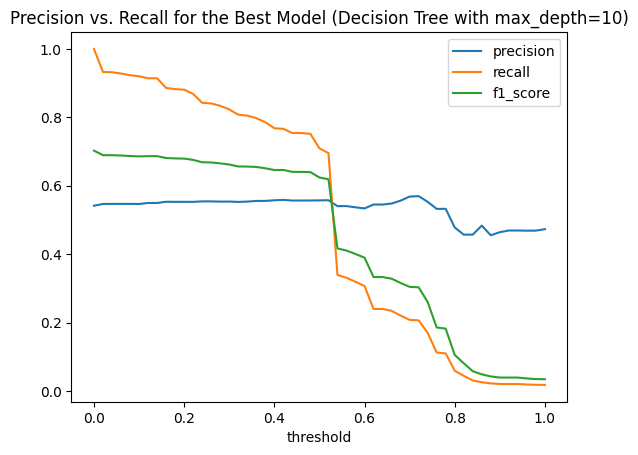

In [154]:
# Try to find high Precision score points
df_scores.plot.line(
    x='threshold',
    y=['precision','recall', 'f1_score'],
    title = 'Precision vs. Recall for the Best Model (Decision Tree with max_depth=10)'
)

Choose threshold [0.68..0.74]

* pred7 and pred8 are 2 decision rules for the Decision Tree (max_depth=13)



In [157]:
# adding Decision Tree predictors (clf_best) to the dataset for 2 new rules: Threshold = 0.68 and 0.74

y_pred_all = clf_best.predict_proba(X_all)
y_pred_all_class1 = [k[1] for k in y_pred_all] #list of predictions for class "1"
y_pred_all_class1_array = np.array(y_pred_all_class1) # (Numpy Array) np.array of predictions for class "1" , converted from a list

# defining a new prediction vector is easy now, as the dimensions will match
new_df['proba_pred7'] = y_pred_all_class1_array
new_df['pred7_clf_best_rule_68'] = (y_pred_all_class1_array >= 0.68).astype(int)

new_df['proba_pred8'] = y_pred_all_class1_array
new_df['pred8_clf_best_rule_74'] = (y_pred_all_class1_array >= 0.74).astype(int)


#### For RandomForest

In [158]:
# adding Random Forest predictors (rf_best)
rf_best

RandomForestClassifier(max_depth=18, n_estimators=500, n_jobs=-1,
                       random_state=42)

In [159]:
# predicting probability instead of a label
y_pred_test = rf_best.predict_proba(X_test)
y_pred_test

array([[0.43589513, 0.56410487],
       [0.51471918, 0.48528082],
       [0.52829642, 0.47170358],
       ...,
       [0.53712914, 0.46287086],
       [0.58010717, 0.41989283],
       [0.54638606, 0.45361394]])

In [160]:
# k[1] is the second element in the list of Class predictions
y_pred_test_class1 = [k[1] for k in y_pred_test]

In [161]:
y_pred_test_class1_df = pd.DataFrame(y_pred_test_class1, columns=['Class1_probability'])
y_pred_test_class1_df.head()

,Class1_probability
0,0.564105
1,0.485281
2,0.471704
3,0.494413
4,0.514155


In [163]:
# Mean prediction is 0.50, median is 0.50, 75% quantile is 0.53
y_pred_test_class1_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Class1_probability,39035.0,0.502251,0.038014,0.356269,0.476077,0.50137,0.52723,0.649801


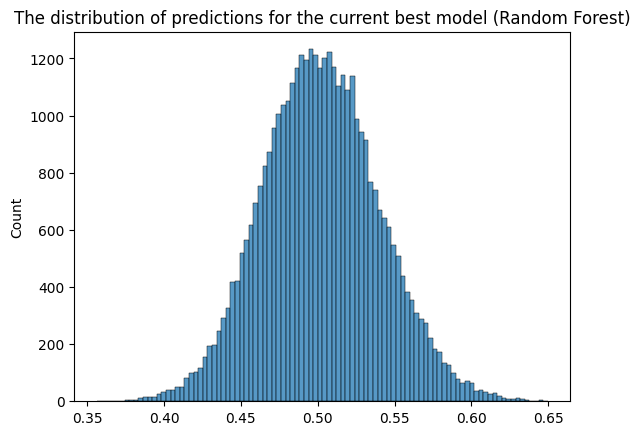

In [164]:
sns.histplot(y_pred_test_class1)

# Add a title
plt.title('The distribution of predictions for the current best model (Random Forest)')

# Show the plot
plt.show()

In [165]:
df_scores = tpr_fpr_dataframe(
    y_test,
    y_pred_test_class1,
    only_even=True
)

# df_scores with threshold > 0.5
df_scores[(df_scores.threshold>=0.5)]

,threshold,tp,fp,fn,tn,precision,recall,accuracy,f1_score,tpr,fpr
25,0.50,11236,8831,9907,9061,0.559924,0.531429,0.519969,0.545305,0.531429,0.493573
26,0.52,6982,5328,14161,12564,0.567181,0.330227,0.500730,0.417421,0.330227,0.297787
27,0.54,3654,2585,17489,15307,0.585671,0.172823,0.485744,0.266891,0.172823,0.144478
28,0.56,1608,1058,19535,16834,0.603151,0.076054,0.472448,0.135075,0.076054,0.059133
29,0.58,598,326,20545,17566,0.647186,0.028284,0.465326,0.054199,0.028284,0.018220
30,0.60,186,85,20957,17807,0.686347,0.008797,0.460945,0.017372,0.008797,0.004751
31,0.62,47,7,21096,17885,0.870370,0.002223,0.459383,0.004435,0.002223,0.000391
32,0.64,5,0,21138,17892,1.000000,0.000236,0.458486,0.000473,0.000236,0.000000
33,0.66,0,0,21143,17892,1.000000,0.000000,0.458358,0.000000,0.000000,0.000000
34,0.68,0,0,21143,17892,1.000000,0.000000,0.458358,0.000000,0.000000,0.000000


<Axes: title={'center': 'Precision vs. Recall for the Best Model (Decision Tree with max_depth=10)'}, xlabel='threshold'>

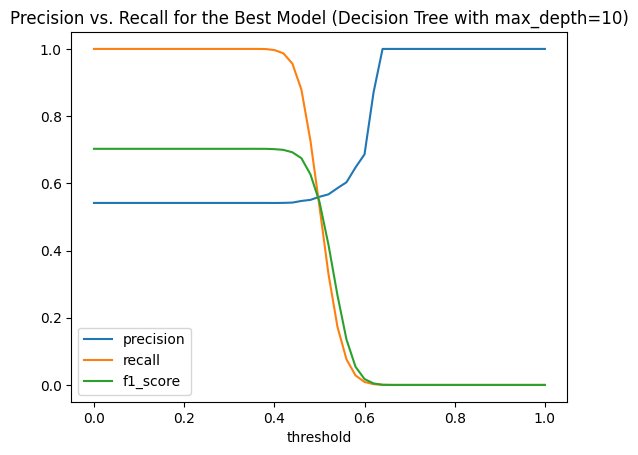

In [166]:
# Try to find high Precision score points
df_scores.plot.line(
    x='threshold',
    y=['precision','recall', 'f1_score'],
    title = 'Precision vs. Recall for the Best Model (Decision Tree with max_depth=10)'
)

Choose threshold [0.58..0.62]

* pred9 and pred10 are 2 decision rules for the Random Forest

In [167]:
# adding Random Forest predictors (rf_best) to the dataset for 2 new rules: Threshold = 0.58 and 0.62

y_pred_all = rf_best.predict_proba(X_all)
y_pred_all_class1 = [k[1] for k in y_pred_all] #list of predictions for class "1"
y_pred_all_class1_array = np.array(y_pred_all_class1) # (Numpy Array) np.array of predictions for class "1" , converted from a list

# defining a new prediction vector is easy now, as the dimensions will match
new_df['proba_pred9'] = y_pred_all_class1_array
new_df['pred9_rf_best_rule_58'] = (y_pred_all_class1_array >= 0.58).astype(int)

new_df['proba_pred10'] = y_pred_all_class1_array
new_df['pred10_rf_best_rule_62'] = (y_pred_all_class1_array >= 0.62).astype(int)

# new predictors
new_df['proba_pred11'] = y_pred_all_class1_array
new_df['pred11_rf_best_rule_51'] = (y_pred_all_class1_array >= 0.51).astype(int)

new_df['proba_pred12'] = y_pred_all_class1_array
new_df['pred12_rf_best_rule_52'] = (y_pred_all_class1_array >= 0.52).astype(int)

new_df['proba_pred13'] = y_pred_all_class1_array
new_df['pred13_rf_best_rule_53'] = (y_pred_all_class1_array >= 0.53).astype(int)

new_df['proba_pred14'] = y_pred_all_class1_array
new_df['pred14_rf_best_rule_54'] = (y_pred_all_class1_array >= 0.54).astype(int)

new_df['proba_pred15'] = y_pred_all_class1_array
new_df['pred15_rf_best_rule_55'] = (y_pred_all_class1_array >= 0.55).astype(int)

new_df['proba_pred16'] = y_pred_all_class1_array
new_df['pred16_rf_best_rule_56'] = (y_pred_all_class1_array >= 0.56).astype(int)

new_df['proba_pred17'] = y_pred_all_class1_array
new_df['pred17_rf_best_rule_57'] = (y_pred_all_class1_array >= 0.57).astype(int)

new_df['proba_pred18'] = y_pred_all_class1_array
new_df['pred18_rf_best_rule_59'] = (y_pred_all_class1_array >= 0.59).astype(int)

new_df['proba_pred19'] = y_pred_all_class1_array
new_df['pred19_rf_best_rule_60'] = (y_pred_all_class1_array >= 0.60).astype(int)

In [171]:
# new prediction is added --> need to recalculate the correctness
PREDICTIONS, IS_CORRECT = get_predictions_correctness(new_df, to_predict='is_positive_growth_5d_future')

Prediction columns founded: ['pred0_manual_cci', 'pred1_manual_prev_g1', 'pred2_manual_prev_g1_and_snp', 'pred3_manual_gdp_and_fastd', 'pred4_manual_gdp_and_wti30d', 'pred5_clf_10', 'pred6_clf_best', 'pred7_clf_best_rule_68', 'pred8_clf_best_rule_74', 'pred9_rf_best_rule_58', 'pred10_rf_best_rule_62', 'pred11_rf_best_rule_51', 'pred12_rf_best_rule_52', 'pred13_rf_best_rule_53', 'pred14_rf_best_rule_54', 'pred15_rf_best_rule_55', 'pred16_rf_best_rule_56', 'pred17_rf_best_rule_57', 'pred18_rf_best_rule_59', 'pred19_rf_best_rule_60']
Created columns is_correct: ['is_correct_pred0', 'is_correct_pred1', 'is_correct_pred2', 'is_correct_pred3', 'is_correct_pred4', 'is_correct_pred5', 'is_correct_pred6', 'is_correct_pred7', 'is_correct_pred8', 'is_correct_pred9', 'is_correct_pred10', 'is_correct_pred11', 'is_correct_pred12', 'is_correct_pred13', 'is_correct_pred14', 'is_correct_pred15', 'is_correct_pred16', 'is_correct_pred17', 'is_correct_pred18', 'is_correct_pred19']
Precision on TEST set fo

In [173]:
PREDICTIONS

['pred0_manual_cci',
 'pred1_manual_prev_g1',
 'pred2_manual_prev_g1_and_snp',
 'pred3_manual_gdp_and_fastd',
 'pred4_manual_gdp_and_wti30d',
 'pred5_clf_10',
 'pred6_clf_best',
 'pred7_clf_best_rule_68',
 'pred8_clf_best_rule_74',
 'pred9_rf_best_rule_58',
 'pred10_rf_best_rule_62',
 'pred11_rf_best_rule_51',
 'pred12_rf_best_rule_52',
 'pred13_rf_best_rule_53',
 'pred14_rf_best_rule_54',
 'pred15_rf_best_rule_55',
 'pred16_rf_best_rule_56',
 'pred17_rf_best_rule_57',
 'pred18_rf_best_rule_59',
 'pred19_rf_best_rule_60']

In [174]:
# Unique trading days on Test (4 years)
new_df[(new_df.split=='test')].Date.nunique()


960

### Agg. stats on ALL predictions

In [176]:
# let's review the Predictions:
PREDICTIONS, IS_CORRECT = get_predictions_correctness(new_df, to_predict='is_positive_growth_5d_future')


Prediction columns founded: ['pred0_manual_cci', 'pred1_manual_prev_g1', 'pred2_manual_prev_g1_and_snp', 'pred3_manual_gdp_and_fastd', 'pred4_manual_gdp_and_wti30d', 'pred5_clf_10', 'pred6_clf_best', 'pred7_clf_best_rule_68', 'pred8_clf_best_rule_74', 'pred9_rf_best_rule_58', 'pred10_rf_best_rule_62', 'pred11_rf_best_rule_51', 'pred12_rf_best_rule_52', 'pred13_rf_best_rule_53', 'pred14_rf_best_rule_54', 'pred15_rf_best_rule_55', 'pred16_rf_best_rule_56', 'pred17_rf_best_rule_57', 'pred18_rf_best_rule_59', 'pred19_rf_best_rule_60']
Created columns is_correct: ['is_correct_pred0', 'is_correct_pred1', 'is_correct_pred2', 'is_correct_pred3', 'is_correct_pred4', 'is_correct_pred5', 'is_correct_pred6', 'is_correct_pred7', 'is_correct_pred8', 'is_correct_pred9', 'is_correct_pred10', 'is_correct_pred11', 'is_correct_pred12', 'is_correct_pred13', 'is_correct_pred14', 'is_correct_pred15', 'is_correct_pred16', 'is_correct_pred17', 'is_correct_pred18', 'is_correct_pred19']
Precision on TEST set fo

The best predictions are:

* pred10_rf_best_rule_62 (correctness: 0.87 on 47 cases)
* pred19_rf_best_rule_60 (correctness: 0.686 on 186 cases)
* pred18_rf_best_rule_59 (correctness: 0.665 on 340 cases)
* pred9_rf_best_rule_58 (correctness: 0.647 on 598 cases)
* pred8_clf_best_rule_74 (correctness: 0.636 on 14 cases)
* pred17_rf_best_rule_57 (correctness: 0.625 on 1020 cases)

In [177]:
# check approx. periods : Train is 2000-01...2017-01, Valid is 2017-01..2020-09, Test is 2020-09..2024-05
new_df.groupby('split').Date.agg(['min','max'])

,min,max
split,,
test,2020-11-04,2024-07-08
train,2000-01-03,2017-03-01
validation,2017-03-02,2020-11-03


In [178]:
# Easier solution not using regular expressions

# Example string
example_string = "pred10_rf_best_rule_60"

# Split the string by '_'
parts = example_string.split('_')

# Extract the part with 'pred' and remove the 'pred' prefix
pred_number = parts[0].replace('pred', '')

# Print the result
print(pred_number)

# Print in one line
print(int(example_string.split('_')[0].replace('pred', '')))

10
10


In [179]:
# all predictions
PREDICTIONS

['pred0_manual_cci',
 'pred1_manual_prev_g1',
 'pred2_manual_prev_g1_and_snp',
 'pred3_manual_gdp_and_fastd',
 'pred4_manual_gdp_and_wti30d',
 'pred5_clf_10',
 'pred6_clf_best',
 'pred7_clf_best_rule_68',
 'pred8_clf_best_rule_74',
 'pred9_rf_best_rule_58',
 'pred10_rf_best_rule_62',
 'pred11_rf_best_rule_51',
 'pred12_rf_best_rule_52',
 'pred13_rf_best_rule_53',
 'pred14_rf_best_rule_54',
 'pred15_rf_best_rule_55',
 'pred16_rf_best_rule_56',
 'pred17_rf_best_rule_57',
 'pred18_rf_best_rule_59',
 'pred19_rf_best_rule_60']

In [180]:
# all predictions on MODELS (not-manual predictions)
PREDICTIONS_ON_MODELS = [p for p in PREDICTIONS if int(p.split('_')[0].replace('pred', ''))>=5]
PREDICTIONS_ON_MODELS

['pred5_clf_10',
 'pred6_clf_best',
 'pred7_clf_best_rule_68',
 'pred8_clf_best_rule_74',
 'pred9_rf_best_rule_58',
 'pred10_rf_best_rule_62',
 'pred11_rf_best_rule_51',
 'pred12_rf_best_rule_52',
 'pred13_rf_best_rule_53',
 'pred14_rf_best_rule_54',
 'pred15_rf_best_rule_55',
 'pred16_rf_best_rule_56',
 'pred17_rf_best_rule_57',
 'pred18_rf_best_rule_59',
 'pred19_rf_best_rule_60']

In [181]:
# all predictions on Models - correctness
IS_CORRECT_ON_MODELS = [p for p in IS_CORRECT if int(p.replace('is_correct_pred', ''))>=5]
IS_CORRECT_ON_MODELS

['is_correct_pred5',
 'is_correct_pred6',
 'is_correct_pred7',
 'is_correct_pred8',
 'is_correct_pred9',
 'is_correct_pred10',
 'is_correct_pred11',
 'is_correct_pred12',
 'is_correct_pred13',
 'is_correct_pred14',
 'is_correct_pred15',
 'is_correct_pred16',
 'is_correct_pred17',
 'is_correct_pred18',
 'is_correct_pred19']

In [193]:
# prediction stats
new_df.groupby('split')[PREDICTIONS].agg(['count','sum','mean']).T

split                                       test          train    validation
pred0_manual_cci             count  39035.000000  146336.000000  38280.000000
                             sum     1089.000000    3804.000000   1113.000000
                             mean       0.027898       0.025995      0.029075
pred1_manual_prev_g1         count  39035.000000  146336.000000  38280.000000
                             sum    19849.000000   72858.000000  19785.000000
                             mean       0.508492       0.497882      0.516850
pred2_manual_prev_g1_and_snp count  39035.000000  146336.000000  38280.000000
                             sum    12744.000000   47816.000000  13657.000000
                             mean       0.326476       0.326755      0.356766
pred3_manual_gdp_and_fastd   count  39035.000000  146336.000000  38280.000000
                             sum    39012.000000  128823.000000  38272.000000
                             mean       0.999411       0.880323      0.999791
pred4_manual_gdp_and_wti30d  count  39035.000000  146336.000000  38280.000000
                             sum        0.000000    6029.000000      0.000000
                             mean       0.000000       0.041200      0.000000
pred5_clf_10                 count  39035.000000  146336.000000  38280.000000
                             sum    29569.000000  115227.000000  33208.000000
                             mean       0.757500       0.787414      0.867503
pred6_clf_best               count  39035.000000  146336.000000  38280.000000
                             sum    30194.000000  110053.000000  33401.000000
                             mean       0.773511       0.752057      0.872544
pred7_clf_best_rule_68       count  39035.000000  146336.000000  38280.000000
                             sum       28.000000    4290.000000    399.000000
                             mean       0.000717       0.029316      0.010423
pred8_clf_best_rule_74       count  39035.000000  146336.000000  38280.000000
                             sum       22.000000    1703.000000    313.000000
                             mean       0.000564       0.011638      0.008177
pred9_rf_best_rule_58        count  39035.000000  146336.000000  38280.000000
                             sum      924.000000   64303.000000  19375.000000
                             mean       0.023671       0.439420      0.506139
pred10_rf_best_rule_62       count  39035.000000  146336.000000  38280.000000
                             sum       54.000000   50279.000000  16121.000000
                             mean       0.001383       0.343586      0.421134
pred11_rf_best_rule_51       count  39035.000000  146336.000000  38280.000000
                             sum    16093.000000   84671.000000  23950.000000
                             mean       0.412271       0.578607      0.625653
pred12_rf_best_rule_52       count  39035.000000  146336.000000  38280.000000
                             sum    12310.000000   82015.000000  23322.000000
                             mean       0.315358       0.560457      0.609248
pred13_rf_best_rule_53       count  39035.000000  146336.000000  38280.000000
                             sum     8889.000000   79340.000000  22679.000000
                             mean       0.227719       0.542177      0.592450
pred14_rf_best_rule_54       count  39035.000000  146336.000000  38280.000000
                             sum     6239.000000   76571.000000  22015.000000
                             mean       0.159831       0.523255      0.575104
pred15_rf_best_rule_55       count  39035.000000  146336.000000  38280.000000
                             sum     4172.000000   73622.000000  21404.000000
                             mean       0.106878       0.503102      0.559143
pred16_rf_best_rule_56       count  39035.000000  146336.000000  38280.000000
                             sum     2666.000000   70564.000000  20766.000000
                      

Most correct:
* pred10_rf_best_rule_62 may happen 0.14% cases - very rare
* pred19_rf_best_rule_60 may happen 0.7% cases - pretty rarely

## Trading Simulations

* Investing $100 on every positive prediction
* fees = 0.1% for each buy and sell operation ==> 0.2% for buy+sell operation

### Calculate fin. result from simulations for one predictor 'pred10_rf_best_rule_62'

In [195]:
# current prediction
pred = 'pred10_rf_best_rule_62'


# Total Number of Investment Opportunities
new_df[new_df.split=='test'].Close.count()

39035

In [196]:
# Total Number of Days (~4 years of trading)
new_df[new_df.split=='test'].Date.nunique()

960

In [197]:
# check actual future growth with 'growth_future_5d', correctness of the prediction with 'is_positive_growth_5d_future'
TO_PREDICT

['growth_future_5d', 'is_positive_growth_5d_future']

In [198]:
# GROSS REVENUE: ONLY when current_prediction equals to 1: invest $100 into that stock (buy), and sell in 1 week (sell)
new_df['sim1_gross_rev_pred6'] = new_df[pred] * 100 * (new_df['growth_future_5d']-1)

# FEES: 0.1% for each operation , 0.2% for buy+sell ONLY when current_prediction equals to one
new_df['sim1_fees_pred6'] = -new_df[pred] * 100 * 0.002

# NET REVENUE: GROSS_REVENUE + FEES
new_df['sim1_net_rev_pred6'] = new_df['sim1_gross_rev_pred6'] + new_df['sim1_fees_pred6']

COLUMNS_FIN_RESULT = ['Date','Ticker','Close']+TO_PREDICT+ [pred,  'sim1_gross_rev_pred6','sim1_fees_pred6','sim1_net_rev_pred6']
new_df[(new_df.split=='test')&(new_df[pred]==1)][COLUMNS_FIN_RESULT]


,Date,Ticker,Close,growth_future_5d,is_positive_growth_5d_future,pred10_rf_best_rule_62,sim1_gross_rev_pred6,sim1_fees_pred6,sim1_net_rev_pred6
4831,2023-10-27,GOOG,123.400002,1.056483,1,1,5.648289,-0.2,5.448289
6233,2023-10-30,NVDA,41.160999,1.111513,1,1,11.151334,-0.2,10.951334
2877,2023-10-25,META,299.529999,1.041131,1,1,4.113101,-0.2,3.913101
6911,2023-10-24,BRK-B,338.630005,1.007973,1,1,0.797325,-0.2,0.597325
6914,2023-10-27,BRK-B,331.709991,1.060595,1,1,6.059512,-0.2,5.859512
6915,2023-10-30,BRK-B,337.410004,1.027326,1,1,2.732581,-0.2,2.532581
12964,2023-10-30,LLY,565.710022,1.052111,1,1,5.211139,-0.2,5.011139
3931,2023-10-30,V,233.080002,1.044663,1,1,4.466284,-0.2,4.266284
10997,2023-10-27,JPM,135.690002,1.053873,1,1,5.387275,-0.2,5.187275
10998,2023-10-30,JPM,137.419998,1.048465,1,1,4.846461,-0.2,4.646461


In [199]:
# DAILY INVESTMENTS
filter_test_and_positive_pred = (new_df.split=='test')&(new_df[pred]==1)
df_investments_count_daily = pd.DataFrame(new_df[filter_test_and_positive_pred].groupby('Date')[pred].count())
sim1_avg_investments_per_day = df_investments_count_daily[pred].quantile(0.75)  # 75% case - how many $100 investments per day do we have?
print(sim1_avg_investments_per_day)

3.0


In [200]:
# how many times do we invest?
df_investments_count_daily.describe().T

,count,mean,std,min,25%,50%,75%,max
pred10_rf_best_rule_62,18.0,3.0,3.105971,1.0,1.0,1.5,3.0,12.0


In [201]:
new_df[(new_df.split=='test')&(new_df[pred]==1)][['sim1_gross_rev_pred6','sim1_fees_pred6','sim1_net_rev_pred6']].sum()


sim1_gross_rev_pred6    286.364998
sim1_fees_pred6         -10.800000
sim1_net_rev_pred6      275.564998
dtype: float64

### Calculate fin. results for all fields

Simplified and approximate calculation

In [202]:
# Calculate fin. result for ALL predictions (manual and produced by models)

sim1_results = [] # results in Array

# Iterate over all predictions
for pred in PREDICTIONS:
    print(f'Calculating sumulation for prediction {pred}:')
    print(f"    Count times of investment {len(new_df[(new_df.split=='test')&(new_df[pred]==1)])} out of {len(new_df[(new_df.split=='test')])} TEST records")

    # Prefix: e.g. pred1 or pred10
    pred_prefix= pred.split('_')[0]

    # Fin. result columns: define new records for EACH positive prediction
    new_df['sim1_gross_rev_'+pred_prefix] = new_df[pred] * 100 * (new_df['growth_future_5d']-1)
    new_df['sim1_fees_'+pred_prefix] = -new_df[pred] * 100 * 0.002
    new_df['sim1_net_rev_'+pred_prefix] = new_df['sim1_gross_rev_'+pred_prefix] + new_df['sim1_fees_'+pred_prefix]

    # calculate agg. results for each PREDICTION columns (pred) on TEST
    filter_test_and_positive_pred = (new_df.split=='test')&(new_df[pred]==1) # filter records on TEST set, when current prediction is 1 (we invest $100 for 1 week ahead - 5 periods)
    sim1_count_investments = len(new_df[filter_test_and_positive_pred])
    sim1_gross_rev = new_df[filter_test_and_positive_pred]['sim1_gross_rev_'+pred_prefix].sum()
    sim1_fees = new_df[filter_test_and_positive_pred]['sim1_fees_'+pred_prefix].sum()
    sim1_net_rev = new_df[filter_test_and_positive_pred]['sim1_net_rev_'+pred_prefix].sum()

    if sim1_gross_rev>0:
        sim1_fees_percentage = -sim1_fees/sim1_gross_rev
    else:
        sim1_fees_percentage = None

    if sim1_count_investments>0:
        sim1_average_net_revenue = sim1_net_rev/sim1_count_investments
    else:
        sim1_average_net_revenue = None

    # APPROXIMATE CAPITAL REQUIRED and CAGR Calculation
    df_investments_count_daily = pd.DataFrame(new_df[filter_test_and_positive_pred].groupby('Date')[pred].count())
    sim1_avg_investments_per_day = df_investments_count_daily[pred].mean()
    sim1_q75_investments_per_day = df_investments_count_daily[pred].quantile(0.75)  # 75% case - how many $100 investments per day do we have?
    # df_investments_count_daily[pred].mean()
    sim1_capital = 100 * 5 * sim1_q75_investments_per_day # 5 days in a row with positive predictions
    # CAGR: average growth per year. E.g. if you have 1.5 return (50% growth in 4 years) --> (1.5)**(1/4) = 1.106 or 10.6% average
    sim1_CAGR = ((sim1_capital+sim1_net_rev)/sim1_capital)**(1/4)

    # append to DF
    sim1_results.append((pred,sim1_count_investments,sim1_gross_rev,sim1_fees,sim1_net_rev,sim1_fees_percentage,sim1_average_net_revenue,sim1_avg_investments_per_day,sim1_capital,sim1_CAGR))

    # output for all predictions with some positive predictions
    if  sim1_count_investments>1:
        print(f"    Financial Result: \n {new_df[filter_test_and_positive_pred][['sim1_gross_rev_'+pred_prefix,'sim1_fees_'+pred_prefix,'sim1_net_rev_'+pred_prefix]].sum()}")
        print(f"        Count Investments in 4 years (on TEST): {sim1_count_investments}")
        print(f"        Gross Revenue: ${int(sim1_gross_rev)}")
        print(f"        Fees (0.2% for buy+sell): ${int(-sim1_fees)}")
        print(f"        Net Revenue: ${int(sim1_net_rev)}")
        print(f"        Fees are {int(-100.0*sim1_fees/sim1_gross_rev)} % from Gross Revenue")
        print(f"        Capital Required : ${int(sim1_capital)} (Vbegin)")
        print(f"        Final value (Vbegin + Net_revenue) : ${int(sim1_capital + sim1_net_rev)} (Vfinal)")

        print(f"        Average CAGR on TEST (4 years) : {np.round(sim1_CAGR,3)}, or {np.round(100.0*(sim1_CAGR-1),1)}% ")

        print(f"        Average daily stats: ")
        print(f"            Average net revenue per investment: ${np.round(sim1_net_rev/sim1_count_investments,2)} ")
        print(f"            Average investments per day: {int(np.round(sim1_avg_investments_per_day))} ")
        print(f"            Q75 investments per day: {int(np.round(sim1_q75_investments_per_day))} ")
        print('=============================================+')


# results in a DataFrame from an Array
columns_simulation = ['prediction', 'sim1_count_investments', 'sim1_gross_rev', 'sim1_fees', 'sim1_net_rev', 'sim1_fees_percentage','sim1_average_net_revenue','sim1_avg_investments_per_day','sim1_capital','sim1_CAGR']

df_sim1_results = pd.DataFrame(sim1_results,columns=columns_simulation)

Calculating sumulation for prediction pred0_manual_cci:
    Count times of investment 1089 out of 39035 TEST records
    Financial Result: 
 sim1_gross_rev_pred0    430.162009
sim1_fees_pred0        -217.800000
sim1_net_rev_pred0      214.762009
dtype: float64
        Count Investments in 4 years (on TEST): 1089
        Gross Revenue: $430
        Fees (0.2% for buy+sell): $217
        Net Revenue: $214
        Fees are 50 % from Gross Revenue
        Capital Required : $1500 (Vbegin)
        Final value (Vbegin + Net_revenue) : $1714 (Vfinal)
        Average CAGR on TEST (4 years) : 1.034, or 3.4% 
        Average daily stats: 
            Average net revenue per investment: $0.2 
            Average investments per day: 2 
            Q75 investments per day: 3 
=============================================+
Calculating sumulation for prediction pred1_manual_prev_g1:
    Count times of investment 19849 out of 39035 TEST records
    Financial Result: 
 sim1_gross_rev_pred1    7564.772

In [203]:
df_sim1_results['sim1_growth_capital_4y'] = (df_sim1_results.sim1_net_rev+df_sim1_results.sim1_capital) / df_sim1_results.sim1_capital

# final comparison
df_sim1_results


,prediction,sim1_count_investments,sim1_gross_rev,sim1_fees,sim1_net_rev,sim1_fees_percentage,sim1_average_net_revenue,sim1_avg_investments_per_day,sim1_capital,sim1_CAGR,sim1_growth_capital_4y
0,pred0_manual_cci,1089,430.162009,-217.8,214.762009,0.506321,0.197210,2.066414,1500.0,1.034018,1.143175
1,pred1_manual_prev_g1,19849,7564.772441,-3969.8,3620.172441,0.524775,0.182386,20.719207,13500.0,1.061191,1.268161
2,pred2_manual_prev_g1_and_snp,12744,4320.174390,-2548.8,1790.174390,0.589976,0.140472,26.385093,15500.0,1.027701,1.115495
3,pred3_manual_gdp_and_fastd,39012,17493.747988,-7802.4,9734.347988,0.446011,0.249522,40.637500,21500.0,1.097864,1.452760
4,pred4_manual_gdp_and_wti30d,0,0.000000,0.0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN
5,pred5_clf_10,29569,16755.675144,-5913.8,10879.475144,0.352943,0.367935,31.059874,18500.0,1.122582,1.588080
6,pred6_clf_best,30194,17728.640284,-6038.8,11727.840284,0.340624,0.388416,31.484880,19000.0,1.127703,1.617255
7,pred7_clf_best_rule_68,28,26.899081,-5.6,21.299081,0.208186,0.760681,4.000000,2500.0,1.002123,1.008520
8,pred8_clf_best_rule_74,22,-7.064369,-4.4,-11.464369,NaN,-0.521108,3.666667,2500.0,0.998852,0.995414
9,pred9_rf_best_rule_58,924,1547.553973,-184.8,1362.753973,0.119414,1.474842,4.714286,3000.0,1.098145,1.454251


In [204]:
# Create the scatter plot
fig = px.scatter(
    df_sim1_results.dropna(),
    x='sim1_avg_investments_per_day',
    y='sim1_CAGR',
    size='sim1_growth_capital_4y',  # Use the 'size' parameter for sim1_CAGR
    text='prediction',
    title='Compound Annual Growth vs. Time spent (Average investments per day)',
    labels={'sim1_capital': 'Initial Capital Requirement', 'growth_capital_4y': '4-Year Capital Growth'}
)

# Update the layout to improve readability of the annotations
fig.update_traces(textposition='top center')

# Show the plot
fig.show()

In [205]:
df_sim1_results[df_sim1_results.prediction.isin(['pred10_rf_best_rule_62','pred19_rf_best_rule_60'])]

,prediction,sim1_count_investments,sim1_gross_rev,sim1_fees,sim1_net_rev,sim1_fees_percentage,sim1_average_net_revenue,sim1_avg_investments_per_day,sim1_capital,sim1_CAGR,sim1_growth_capital_4y
10,pred10_rf_best_rule_62,54,286.364998,-10.8,275.564998,0.037714,5.103056,3.000000,1500.0,1.043065,1.183710
19,pred19_rf_best_rule_60,271,613.028532,-54.2,558.828532,0.088414,2.062098,3.816901,2250.0,1.057026,1.248368


Best prediction is pred15_rf_best_rule_55 (THRESHOLD=0.55), with CAGR = 1.1223 and not so big frequency

### Advanced Simulation

* to_predict = 'is_positive_growth_5d_future'
* invest ~20% of capital each day (sell positions from 5 days ago), REINVEST PREVIOUS GAINS
* use predict_proba predictions
* select top1..3..x predictions > threshold (0.53)
* invest proportionally the prediction
* stop loss y%
* take profit z%
* Not included: portfolio optimization


More real simulation

In [207]:
from dataclasses import dataclass

@dataclass
class SimulationParams:
    initial_capital: float
    threshold: float
    fees: float
    top_k: int
    portfolio_optimization: bool
    stop_loss: float
    take_profit: float
    lower_entry: float

In [216]:
# Example of initializing with some values
sim_params = SimulationParams(
    initial_capital=10000,        # initial capital = $10k
    threshold=0.55,               # select all binary predictions with probability>=0.55
    fees=0.002,                   # trading fees = 0.2% (buy+sell)
    top_k=10,                     # select top_k predictions
    portfolio_optimization=False, # no portfolio optimizaiton
    stop_loss=0.9,                # automatic sell (with loss) if price (any of next 5 days) is lower than -5% from Adj.Close
    take_profit=1.2,              # automatic sell (with profit) if price (any of next 5 days) is higher than +20% from Adj.Close
    lower_entry= 0.995                # buy next day with the price = [Adj.Close] * 0.995 (try to buy cheaper)
)

print(sim_params)

SimulationParams(initial_capital=10000, threshold=0.55, fees=0.002, top_k=10, portfolio_optimization=False, stop_loss=0.9, take_profit=1.2, lower_entry=0.995)


In [217]:
# sorted array of dates for Simulation
DATES = new_df[new_df.split=='test'].sort_values(by='Date').Date.unique()
print(f' Min date {DATES.min()}, max date {DATES.max()}')

 Min date 2020-11-04 00:00:00, max date 2024-07-08 00:00:00


Fill in data for advanced simulation

##### Define rank of prediction (pred15_rf_best_rule_55)

For every day rank tickets as of their feature probability (for the best prediction)

In [218]:
# https://stackoverflow.com/questions/17775935/sql-like-window-functions-in-pandas-row-numbering-in-python-pandas-dataframe
# rank of prediction
new_df["pred15_rank"] = new_df.groupby("Date")["proba_pred15"].rank(method="first", ascending=False)

new_df.head(2)

,Open,High,Low,Close,Adj Close_x,Volume,Ticker,Year,Month,Weekday,...,sim1_fees_pred17,sim1_net_rev_pred17,sim1_gross_rev_pred18,sim1_fees_pred18,sim1_net_rev_pred18,sim1_gross_rev_pred19,sim1_fees_pred19,sim1_net_rev_pred19,pred14_rank,pred15_rank
3490,58.68750,59.3125,56.000,58.28125,36.000633,53228400.0,MSFT,2000,January,0,...,0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,13.0,13.0
3491,56.78125,58.5625,56.125,56.31250,34.784546,54119000.0,MSFT,2000,January,1,...,0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,20.0,20.0


#####  Define Min(Low) for the next 5 days and Max(High) for the next 5 days

In [220]:
# Define a function to get the rolling max High and min Low for the next 5 days

# Sort the DataFrame: Sorting by Ticker and Date ensures that we are looking at each ticker's data in chronological order.
# Rolling window calculation: We use the rolling method with a window of 5 to calculate the maximum high and minimum low over the next 5 days.
# The shift method is used to align these values correctly with the current row.

def rolling_max_min(df, window=5):
    # high/low in 5 days
    df['Max_High_Next_5'] = df['High'].rolling(window=window, min_periods=1).max().shift(-window+1)
    df['Min_Low_Next_5'] = df['Low'].rolling(window=window, min_periods=1).min().shift(-window+1)

    # low in 1 day (for lower entry)
    df['Min_Low_Next_1'] = df['Low'].rolling(window=1, min_periods=1).min().shift(-1)
    return df


In [221]:
# Apply the function to each group of Ticker
# Important!: need to drop index from groupby operation (reset_index) - so that you can merge that afterwards
result = new_df[['Date','High','Low','Adj Close_x','Ticker']].groupby('Ticker').apply(rolling_max_min).reset_index(drop=True)
result.tail(10)


,Date,High,Low,Adj Close_x,Ticker,Max_High_Next_5,Min_Low_Next_5,Min_Low_Next_1
223641,2024-06-21,277.540009,274.579987,275.220001,V,280.390015,266.50,275.269989
223642,2024-06-24,280.390015,275.269989,276.299988,V,280.390015,261.25,273.529999
223643,2024-06-25,277.929993,273.529999,273.529999,V,277.929993,261.25,271.750000
223644,2024-06-26,274.459991,271.750000,273.600006,V,274.459991,261.25,266.500000
223645,2024-06-27,270.589996,266.500000,266.589996,V,270.589996,261.25,261.250000
223646,2024-06-28,268.600006,261.250000,262.470001,V,270.549988,261.25,261.299988
223647,2024-07-01,265.769989,261.299988,263.239990,V,NaN,NaN,262.399994
223648,2024-07-02,268.230011,262.399994,268.230011,V,NaN,NaN,268.149994
223649,2024-07-03,269.750000,268.149994,268.989990,V,NaN,NaN,268.239990
223650,2024-07-05,270.549988,268.239990,270.359985,V,NaN,NaN,NaN


In [222]:
# Calculate the ratios + safe divide
result['Ratio_MaxHighNext5_to_AdjClose'] = np.where(result['Adj Close_x'] == 0, np.nan, result['Max_High_Next_5']/result['Adj Close_x'])
result['Ratio_MinLowNext5_to_AdjClose'] =  np.where(result['Adj Close_x'] == 0, np.nan,  result['Min_Low_Next_5']/result['Adj Close_x'])

result['Ratio_MinLowNext1_to_AdjClose'] =  np.where(result['Adj Close_x'] == 0, np.nan,  result['Min_Low_Next_1']/result['Adj Close_x'])


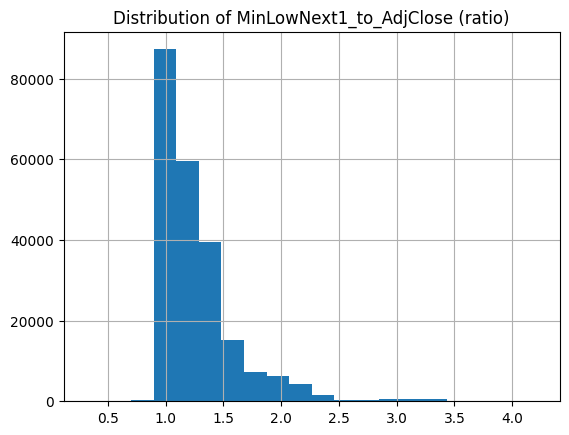

In [223]:
result.Ratio_MinLowNext1_to_AdjClose.hist(bins=20)
plt.title(f'Distribution of MinLowNext1_to_AdjClose (ratio)')
# Show the plot
plt.show()

In [224]:
result.Ratio_MinLowNext1_to_AdjClose.describe().T

count    223608.000000
mean          1.266255
std           0.333898
min           0.311353
25%           1.037435
50%           1.160761
75%           1.373468
max           4.215538
Name: Ratio_MinLowNext1_to_AdjClose, dtype: float64

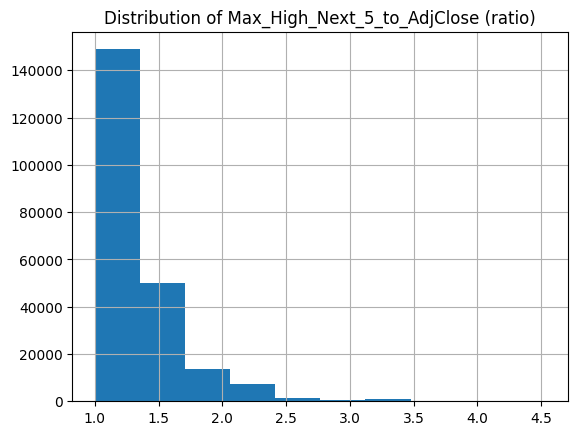

In [225]:
result.Ratio_MaxHighNext5_to_AdjClose.hist()
plt.title(f'Distribution of Max_High_Next_5_to_AdjClose (ratio)')
# Show the plot
plt.show()

In [226]:
result.Ratio_MaxHighNext5_to_AdjClose.describe().T

count    223479.000000
mean          1.323902
std           0.351219
min           1.000000
25%           1.083015
50%           1.212978
75%           1.433125
max           4.537815
Name: Ratio_MaxHighNext5_to_AdjClose, dtype: float64

<Axes: >

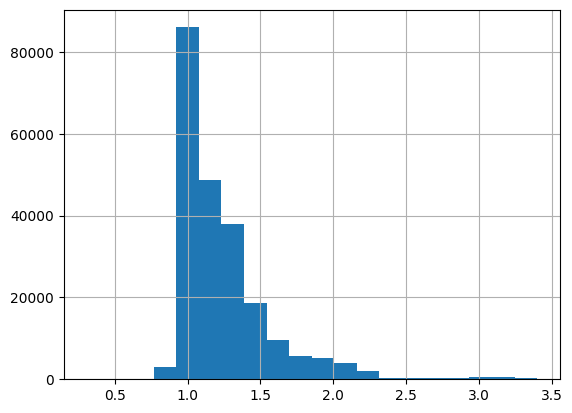

In [227]:
# High intra-day volatility, especially on earlier days after the IPO
result.Ratio_MinLowNext5_to_AdjClose.hist(bins=20)

In [229]:
# ~0.9% STOP LOSS
len(result[result.Ratio_MinLowNext5_to_AdjClose<=0.9])/len(result)

0.008718941565206504

In [230]:
# Merge the results back with the original dataframe
new_df = new_df.merge(result[['Date', 'Ticker', 'Max_High_Next_5', 'Min_Low_Next_5','Ratio_MaxHighNext5_to_AdjClose','Ratio_MinLowNext5_to_AdjClose','Ratio_MinLowNext1_to_AdjClose']], on=['Date', 'Ticker'])


Calculate advanced simulation

In [231]:
# 1. get TOP_K predictions from pred15_rf_best_rule_55,that are higher than THE THRESHOLD
if sim_params.top_k is None:
  one_day_predictions_df = new_df[(new_df.Date==date)&(new_df.proba_pred15 > sim_params.threshold)]
else:
  one_day_predictions_df = new_df[(new_df.Date==date)&(new_df.proba_pred15 > sim_params.threshold)&(new_df.pred15_rank<=sim_params.top_k)]

one_day_predictions_df[['Date','Ticker',to_predict,'growth_future_5d','proba_pred15','pred15_rank']]


,Date,Ticker,is_positive_growth_5d_future,growth_future_5d,proba_pred15,pred15_rank
5244,2020-11-04,MSFT,1,1.000739,0.564105,7.0
11409,2020-11-04,AAPL,1,1.041289,0.571119,4.0
47876,2020-11-04,AVGO,1,1.030963,0.577020,3.0
51978,2020-11-04,V,1,1.096561,0.578563,1.0
70588,2020-11-04,MC.PA,1,1.155524,0.563106,8.0
76775,2020-11-04,ASML,1,1.091514,0.570671,5.0
95544,2020-11-04,SAP,1,1.062784,0.559062,10.0
113737,2020-11-04,SIE.DE,1,1.093616,0.559786,9.0
123673,2020-11-04,CDI.PA,1,1.124805,0.569659,6.0
200834,2020-11-04,600519.SS,1,1.018693,0.578071,2.0


In [232]:
# 2. Get non-normalized weights: probability-threshold + 0.01
one_day_predictions_df['weight'] = one_day_predictions_df.proba_pred14 - sim_params.threshold +0.01

<ipython-input-232-ebf0c7d597eb>:2: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [233]:
# 3. Get normalized weights
one_day_predictions_df['weight_norm'] = one_day_predictions_df['weight']/one_day_predictions_df['weight'].sum()

<ipython-input-233-82f470e7f87b>:2: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [234]:
# 4. Capital: either 1/5 of initial, or everything that you can sell from 5 days ago
one_day_predictions_df['investment'] = one_day_predictions_df['weight_norm'] * sim_params.initial_capital / 5

<ipython-input-234-fea3ea548f07>:2: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [235]:
# See the allocation of an 'investment' at a price = 'Adj.Close' * sim_params.lower_entry (e.g. 0.995 - try to buy cheaper)
one_day_predictions_df[['Date','Ticker','Adj Close_x', to_predict,'growth_future_5d','proba_pred14','pred14_rank','weight','weight_norm', 'investment']]



,Date,Ticker,Adj Close_x,is_positive_growth_5d_future,growth_future_5d,proba_pred14,pred14_rank,weight,weight_norm,investment
5244,2020-11-04,MSFT,209.414688,1,1.000739,0.564105,7.0,0.024105,0.082788,165.576945
11409,2020-11-04,AAPL,112.464310,1,1.041289,0.571119,4.0,0.031119,0.106878,213.756892
47876,2020-11-04,AVGO,330.153259,1,1.030963,0.577020,3.0,0.037020,0.127147,254.294077
51978,2020-11-04,V,188.843048,1,1.096561,0.578563,1.0,0.038563,0.132446,264.892049
70588,2020-11-04,MC.PA,397.924042,1,1.155524,0.563106,8.0,0.023106,0.079357,158.713465
76775,2020-11-04,ASML,370.946289,1,1.091514,0.570671,5.0,0.030671,0.105340,210.680447
95544,2020-11-04,SAP,104.409538,1,1.062784,0.559062,10.0,0.019062,0.065468,130.935894
113737,2020-11-04,SIE.DE,96.166481,1,1.093616,0.559786,9.0,0.019786,0.067955,135.910771
123673,2020-11-04,CDI.PA,361.766663,1,1.124805,0.569659,6.0,0.029659,0.101865,203.730620
200834,2020-11-04,600519.SS,1568.951416,1,1.018693,0.578071,2.0,0.038071,0.130754,261.508840


In [236]:
# 5. Lower Entry: the trade is executed only is Low price for next day is lower than bet
one_day_predictions_df['lower_entry'] = (one_day_predictions_df['Ratio_MinLowNext1_to_AdjClose']<=sim_params.lower_entry).astype(int)




<ipython-input-236-d37557409fb9>:2: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [237]:
# 6. Stop Loss: happens if the current price (or Low price) goes below stop loss threshold during one of the next 5 periods (1 week)
one_day_predictions_df['stop_loss'] = (one_day_predictions_df['Ratio_MinLowNext5_to_AdjClose'] <= sim_params.stop_loss).astype(int)


<ipython-input-237-e50fdb0a5375>:2: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [238]:
# 7. Take Profit: take the money if the current Price (or Max_price) goes higher than sim_params.take_profit
one_day_predictions_df['take_profit'] = (one_day_predictions_df['Ratio_MaxHighNext5_to_AdjClose'] >= sim_params.take_profit).astype(int)


<ipython-input-238-055957879913>:2: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [239]:
import random

def get_future_gross_return(row, sim_params:SimulationParams):
    """future_gross_return, depending on lower_entry, take_profit, stop_loss"""
    if row['lower_entry']==0: # no trade, investment is untouched, no fees
        return row['investment']

    # buy trade is filled for ALL next cases:
    if row['take_profit']==1 and row['stop_loss']==1:
        if random.random()>0.5: #assume take_profit event was first
            return  row['investment']*(sim_params.take_profit+(1-sim_params.lower_entry))
        else: #assume stop_loss event was first
            return row['investment']*(sim_params.stop_loss+(1-sim_params.lower_entry))

    if row['take_profit']==1: # take some good profit, pay fees
        return  row['investment']*(sim_params.take_profit+(1-sim_params.lower_entry))

    if row['stop_loss']==1: # fix the loss, pay fees
        return row['investment']*(sim_params.stop_loss+(1-sim_params.lower_entry))

    # no stop_loss and no take_profit
    if pd.isna(row['growth_future_5d']):
        return row['investment'] # no information on growth in 5 days --> return the same investment in 5 days
    else:
        return row['investment']*(row['growth_future_5d']+(1-sim_params.lower_entry))


In [241]:
def get_fees(row, sim_params:SimulationParams):
    """fees, depending on lower_entry, take_profit, stop_loss"""
    if row['lower_entry']==0: # no trade ==> no fees
        return 0

    # pay fees in all other cases
    return -row['investment']*sim_params.fees

In [242]:
# 8. calculate future returns (when the order is executed + stop_loss True/False + take_profit True/False)
one_day_predictions_df['future_gross_return'] = one_day_predictions_df.apply(lambda row: get_future_gross_return(row,sim_params=sim_params), axis=1)
one_day_predictions_df['fees'] =  one_day_predictions_df.apply(lambda row: get_fees(row,sim_params=sim_params), axis=1)
one_day_predictions_df['future_net_return'] = one_day_predictions_df['future_gross_return'] + one_day_predictions_df['fees']



<ipython-input-242-5eb8e9ca8aa5>:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

<ipython-input-242-5eb8e9ca8aa5>:4: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



##### Wrap up one day simulation into a function

In [243]:
def one_date_simulation(date:str, invest_sum:float, df:pd.DataFrame, sim_params:SimulationParams, predictor:str='proba_pred14'):
    # 1. get TOP_K (or ALL) predictions from the predictor (pred14_rf_best_rule_53 by default), that are higher than THE THRESHOLD
    if sim_params.top_k is None:
        one_day_predictions_df = df[(df.Date==date)&(df[predictor] > sim_params.threshold)]
    else:
        one_day_predictions_df = df[(df.Date==date)&(df[predictor] > sim_params.threshold)&(df.pred14_rank<=sim_params.top_k)]

    FIELDS = ['Adj Close_x', 'Ticker', 'Date', predictor, 'pred14_rank', 'growth_future_5d', 'Ratio_MaxHighNext5_to_AdjClose','Ratio_MinLowNext5_to_AdjClose','Ratio_MinLowNext1_to_AdjClose']
    result_df = one_day_predictions_df[FIELDS].copy()

    # 2. Get non-normalized weights: probability-threshold + 0.01
    result_df['weight'] = result_df[predictor] - sim_params.threshold +0.01

    # 3. Get normalized weights
    result_df['weight_norm'] = result_df['weight']/result_df['weight'].sum()

    # 4. Make bets to allocate 'invest_sum' across all suitable predictions
    result_df['investment'] = result_df['weight_norm'] * invest_sum

    # 5. Lower Entry: the trade is executed only is Low price for next day is lower than the bet (Adj_Close_today * sim_params.lower_entry)
    # [ONLY TRADES with lower_entry==1 are filled by the exchange]
    result_df['lower_entry'] = (result_df['Ratio_MinLowNext1_to_AdjClose'] <= sim_params.lower_entry).astype(int)

    # 6. Stop Loss: happens if the current price (or Low price) goes below stop loss threshold during one of the next 5 periods (1 week)
    result_df['stop_loss'] = (result_df['Ratio_MinLowNext5_to_AdjClose'] <= sim_params.stop_loss).astype(int)

    # 7. Take Profit: take the money if the current Price (or Max_price) goes higher than sim_params.take_profit
    result_df['take_profit'] = (result_df['Ratio_MaxHighNext5_to_AdjClose'] >= sim_params.take_profit).astype(int)

    # 8. Calculate future returns (when the order is executed + stop_loss True/False + take_profit True/False)
    result_df['future_gross_return'] = result_df.apply(lambda row: get_future_gross_return(row,sim_params=sim_params), axis=1)
    result_df['fees'] =  result_df.apply(lambda row: get_fees(row,sim_params=sim_params), axis=1)
    result_df['future_net_return'] = result_df['future_gross_return'] + result_df['fees']

    return result_df


In [244]:
r = one_date_simulation(date='2020-09-14', invest_sum=sim_params.initial_capital/5, df=new_df, sim_params=sim_params, predictor='proba_pred14')
r


,Adj Close_x,Ticker,Date,proba_pred14,pred14_rank,growth_future_5d,Ratio_MaxHighNext5_to_AdjClose,Ratio_MinLowNext5_to_AdjClose,Ratio_MinLowNext1_to_AdjClose,weight,weight_norm,investment,lower_entry,stop_loss,take_profit,future_gross_return,fees,future_net_return
210312,2.466367,601288.SS,2020-09-14,0.623908,1.0,1.009494,1.297455,1.277182,1.277182,0.083908,0.672198,1344.395943,0,0,1,1344.395943,0,1344.395943
218348,5.132133,601939.SS,2020-09-14,0.565111,2.0,1.013051,1.217817,1.190538,1.190538,0.025111,0.201167,402.334638,0,0,1,402.334638,0,402.334638
222728,2.650866,601988.SS,2020-09-14,0.555807,3.0,1.003115,1.222242,1.203380,1.207153,0.015807,0.126635,253.269419,0,0,1,253.269419,0,253.269419


In [245]:
# initial investment
r.investment.sum()

2000.0

In [246]:
# result in 5 days (returns+fees)
r.future_net_return.sum()

2000.0

##### Generate fin result for ALL days

In [247]:
all_dates = new_df[new_df.split=='test'].sort_values(by='Date').Date.unique()
all_dates

<DatetimeArray>
['2020-11-04 00:00:00', '2020-11-05 00:00:00', '2020-11-06 00:00:00',
 '2020-11-09 00:00:00', '2020-11-10 00:00:00', '2020-11-11 00:00:00',
 '2020-11-12 00:00:00', '2020-11-13 00:00:00', '2020-11-14 00:00:00',
 '2020-11-16 00:00:00',
 ...
 '2024-06-25 00:00:00', '2024-06-26 00:00:00', '2024-06-27 00:00:00',
 '2024-06-28 00:00:00', '2024-07-01 00:00:00', '2024-07-02 00:00:00',
 '2024-07-03 00:00:00', '2024-07-04 00:00:00', '2024-07-05 00:00:00',
 '2024-07-08 00:00:00']
Length: 960, dtype: datetime64[ns]

In [248]:
def simulate(df:pd.DataFrame, sim_params:SimulationParams):

    simulation_df = None

    # all dates for simulation
    all_dates = df[df.split=='test'].sort_values(by='Date').Date.unique()

    # arrays of dates and capital available (capital for the first 5 days)
    dates = []
    capital= 5 * [sim_params.initial_capital/5]  # first 5 periods trade with 1/5 of the initial_capital. e.g. [2000,2000,2000,2000,2000]

    for current_date in all_dates[0:-5]:  #growth_future_5d is not defined for the last 5 days : ALL, but last 5 dates

        current_invest_sum = capital[-5]    # take the value or everything that you can sell from 5 days ago

        # one day simulation result
        one_day_simulation_results = one_date_simulation(
            date = current_date,
            invest_sum = current_invest_sum,
            df = df,
            sim_params=sim_params,
            predictor='proba_pred14'
        )

        # add capital available in 5 days
        if len(one_day_simulation_results)==0:  #no predictions -> no trades
            capital.append(current_invest_sum)
        else:
            capital.append(one_day_simulation_results.future_net_return.sum())
        dates.append(current_date)

        if simulation_df is None:
            simulation_df = one_day_simulation_results
        else:
            simulation_df = pd.concat([simulation_df, one_day_simulation_results], ignore_index=True)

    # add last 5 days to make the count of data points equal for dates/capital arrays
    dates.extend(all_dates[-5:])
    capital_df = pd.DataFrame({'capital':capital}, index=pd.to_datetime(dates))

    # results:
    print(f'============================================================================================')
    print(f'SIMULATION STARTED')
    print(f'Simulations params: {sim_params}')
    print(f' Count bids {len(simulation_df)} in total, avg.bids per day {len(simulation_df)/simulation_df.Date.nunique()},  filled bids {len(simulation_df[simulation_df.lower_entry==1])}, fill bids percent = {len(simulation_df[simulation_df.lower_entry==1])/len(simulation_df)}')
    stop_loss_filter = (simulation_df.lower_entry==1)&(simulation_df.stop_loss==1)
    print(f'  Stop loss events: count = {len(simulation_df[stop_loss_filter])}, net loss = {simulation_df[stop_loss_filter].future_net_return.sum()-simulation_df[stop_loss_filter].investment.sum()} ')
    take_profit_filter = (simulation_df.lower_entry==1)&(simulation_df.take_profit==1)
    print(f'  Take profit events: count = {len(simulation_df[take_profit_filter])}, net profit = {simulation_df[take_profit_filter].future_net_return.sum()-simulation_df[take_profit_filter].investment.sum()} ')
    print(f'  Start capital = {sim_params.initial_capital}, Resulting capital: {capital_df[-5:].capital.sum()} ')
    print(f'  CAGR in 4 years: {np.round((capital_df[-5:].capital.sum()/sim_params.initial_capital)**(1/4),3)} or {np.round(((capital_df[-5:].capital.sum()/sim_params.initial_capital)**(1/4)-1)*100.0,2)} % of avg. growth per year')
    print(f'============================================================================================')

    return simulation_df,capital_df

In [249]:
# One initial simulation
sim_params = SimulationParams(
    initial_capital = 10000,        # initial capital = $10k
    threshold = 0.55,               # select all binary predictions with probability>=0.55
    fees = 0.002,                   # trading fees = 0.2% (buy+sell)
    top_k = 5,                      # select top_k=5 predictions
    portfolio_optimization = False, # no portfolio optimization
    stop_loss = 0.8,                # automatic sell (with loss) if price (any of next 5 days) is lower than -20% from Adj.Close
    take_profit = 1.3,              # automatic sell (with profit) if price (any of next 5 days) is higher than +30% from Adj.Close
    lower_entry = 0.99               # buy next day with the price = [Adj.Close] * 0.99 (try to buy cheaper)
)

res, capital = simulate(new_df, sim_params)

SIMULATION STARTED
Simulations params: SimulationParams(initial_capital=10000, threshold=0.55, fees=0.002, top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.3, lower_entry=0.99)
 Count bids 1877 in total, avg.bids per day 3.680392156862745,  filled bids 337, fill bids percent = 0.1795418220564731
  Stop loss events: count = 8, net loss = -665.1530202254576 
  Take profit events: count = 2, net profit = 217.3772464149938 
  Start capital = 10000, Resulting capital: 10415.445002629065 
  CAGR in 4 years: 1.01 or 1.02 % of avg. growth per year


##### Find optimal parameters of simulation

In [250]:
# BEST PREVIOUS CAGR is 1.02%  (top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.3, lower_entry=0.99)
# iterate over lower_entry
for lower_entry in [0.97,0.98,0.99,1,1.01,1.02,1.03]:

  sim_params = SimulationParams(
      initial_capital = 10000,        # initial capital = $10k
      threshold = 0.55,               # select all binary predictions with probability>=0.55
      fees = 0.002,                   # trading fees = 0.2% (buy+sell)
      top_k = 5,                     # select top_k predictions
      portfolio_optimization = False, # no portfolio optimization
      stop_loss = 0.8,                # automatic sell (with loss) if price (any of next 5 days) is lower than -5% from Adj.Close
      take_profit = 1.3,              # automatic sell (with profit) if price (any of next 5 days) is higher than +20% from Adj.Close
      lower_entry = lower_entry       # buy next day with the price = [Adj.Close] * 0.995 (try to buy cheaper)
  )

  res, capital = simulate(new_df, sim_params)

SIMULATION STARTED
Simulations params: SimulationParams(initial_capital=10000, threshold=0.55, fees=0.002, top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.3, lower_entry=0.97)
 Count bids 1877 in total, avg.bids per day 3.680392156862745,  filled bids 120, fill bids percent = 0.06393180607352157
  Stop loss events: count = 7, net loss = -486.60200639981304 
  Take profit events: count = 1, net profit = 146.15282631250614 
  Start capital = 10000, Resulting capital: 10232.83249947792 
  CAGR in 4 years: 1.006 or 0.58 % of avg. growth per year
SIMULATION STARTED
Simulations params: SimulationParams(initial_capital=10000, threshold=0.55, fees=0.002, top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.3, lower_entry=0.98)
 Count bids 1877 in total, avg.bids per day 3.680392156862745,  filled bids 195, fill bids percent = 0.10388918486947256
  Stop loss events: count = 8, net loss = -611.8595200100131 
  Take profit events: count = 2, net profit = 249.270

In [251]:
# BEST PREVIOUS is CAGR 1.6%  (top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.3, lower_entry=0.99 ==> lower_entry=0.98)

# iterate over lower_entry ++ take profit of 5%
  # best lower_entry ==0.98
for lower_entry in [0.97,0.98,0.99,1,1.01,1.02,1.03]:
  # One simulation
  sim_params = SimulationParams(
      initial_capital = 10000,        # initial capital = $10k
      threshold = 0.55,               # select all binary predictions with probability>=0.55
      fees = 0.002,                   # trading fees = 0.2% (buy+sell)
      top_k = 5,                      # select top_k predictions
      portfolio_optimization = False, # no portfolio optimization
      stop_loss = 0.8,                # automatic sell (with loss) if price (any of next 5 days) is lower than -5% from Adj.Close
      take_profit = 1.05,             # automatic sell (with profit) if price (any of next 5 days) is higher than +20% from Adj.Close
      lower_entry = lower_entry       # buy next day with the price = [Adj.Close] * 0.995 (try to buy cheaper)
  )

  res, capital = simulate(new_df, sim_params)

SIMULATION STARTED
Simulations params: SimulationParams(initial_capital=10000, threshold=0.55, fees=0.002, top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.05, lower_entry=0.97)
 Count bids 1877 in total, avg.bids per day 3.680392156862745,  filled bids 120, fill bids percent = 0.06393180607352157
  Stop loss events: count = 7, net loss = -521.5872428444791 
  Take profit events: count = 53, net profit = 2489.187224917383 
  Start capital = 10000, Resulting capital: 12211.344965379067 
  CAGR in 4 years: 1.051 or 5.12 % of avg. growth per year
SIMULATION STARTED
Simulations params: SimulationParams(initial_capital=10000, threshold=0.55, fees=0.002, top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.05, lower_entry=0.98)
 Count bids 1877 in total, avg.bids per day 3.680392156862745,  filled bids 195, fill bids percent = 0.10388918486947256
  Stop loss events: count = 8, net loss = -656.052606457326 
  Take profit events: count = 84, net profit = 3491.

In [252]:
# BEST PREVIOUS is CAGR 6.64%  (top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.3 => 1.05, lower_entry=0.99)
# BEST PREVIOUS is CAGR 6.09%  (top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.3 => 1.05, lower_entry=0.99 ==> lower_entry=0.98)

# iterate over lower_entry ++ take profit of 2%

for lower_entry in [0.97,0.98,0.99,1,1.01,1.02,1.03]:
  # One simulation
  sim_params = SimulationParams(
      initial_capital = 10000,        # initial capital = $10k
      threshold = 0.55,               # select all binary predictions with probability>=0.55
      fees = 0.002,                   # trading fees = 0.2% (buy+sell)
      top_k = 5,                      # select top_k predictions
      portfolio_optimization = False, # no portfolio optimization
      stop_loss = 0.8,                # automatic sell (with loss) if price (any of next 5 days) is lower than -5% from Adj.Close
      take_profit = 1.02,             # automatic sell (with profit) if price (any of next 5 days) is higher than +20% from Adj.Close
      lower_entry = lower_entry       # buy next day with the price = [Adj.Close] * 0.995 (try to buy cheaper)
  )

  res, capital = simulate(new_df, sim_params)

SIMULATION STARTED
Simulations params: SimulationParams(initial_capital=10000, threshold=0.55, fees=0.002, top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.02, lower_entry=0.97)
 Count bids 1877 in total, avg.bids per day 3.680392156862745,  filled bids 120, fill bids percent = 0.06393180607352157
  Stop loss events: count = 7, net loss = -326.9764843192397 
  Take profit events: count = 103, net profit = 2712.654748972098 
  Start capital = 10000, Resulting capital: 12518.145213004012 
  CAGR in 4 years: 1.058 or 5.78 % of avg. growth per year
SIMULATION STARTED
Simulations params: SimulationParams(initial_capital=10000, threshold=0.55, fees=0.002, top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.02, lower_entry=0.98)
 Count bids 1877 in total, avg.bids per day 3.680392156862745,  filled bids 195, fill bids percent = 0.10388918486947256
  Stop loss events: count = 8, net loss = -332.7625947871966 
  Take profit events: count = 159, net profit = 35

In [253]:
# BEST PREVIOUS is CAGR 7.61%  (top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.05 => 1.02, lower_entry=0.99)
# BEST PREVIOUS is CAGR 7.13%  (top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.05 => 1.02, lower_entry=0.99 ==> lower_entry=1.0)

# iterate over stop_loss AND lower_entry
for stop_loss in [0.8,0.85,0.9,0.95]:
  for lower_entry in [0.99,1]:
    # One simulation
    sim_params = SimulationParams(
        initial_capital = 10000,        # initial capital = $10k
        threshold = 0.55,               # select all binary predictions with probability>=0.55
        fees = 0.002,                   # trading fees = 0.2% (buy+sell)
        top_k = 5,                      # select top_k predictions
        portfolio_optimization = False, # no portfolio optimization
        stop_loss = 0.8,                # automatic sell (with loss) if price (any of next 5 days) is lower than -5% from Adj.Close
        take_profit = 1.02,             # automatic sell (with profit) if price (any of next 5 days) is higher than +20% from Adj.Close
        lower_entry = lower_entry       # buy next day with the price = [Adj.Close] * 0.995 (try to buy cheaper)
    )

    res, capital = simulate(new_df, sim_params)

SIMULATION STARTED
Simulations params: SimulationParams(initial_capital=10000, threshold=0.55, fees=0.002, top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.02, lower_entry=0.99)
 Count bids 1877 in total, avg.bids per day 3.680392156862745,  filled bids 337, fill bids percent = 0.1795418220564731
  Stop loss events: count = 8, net loss = -288.2888743840699 
  Take profit events: count = 268, net profit = 4595.119098878204 
  Start capital = 10000, Resulting capital: 13561.833139810575 
  CAGR in 4 years: 1.079 or 7.91 % of avg. growth per year
SIMULATION STARTED
Simulations params: SimulationParams(initial_capital=10000, threshold=0.55, fees=0.002, top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.02, lower_entry=1)
 Count bids 1877 in total, avg.bids per day 3.680392156862745,  filled bids 589, fill bids percent = 0.3137986148108684
  Stop loss events: count = 9, net loss = -794.9205499004138 
  Take profit events: count = 471, net profit = 4415.29

In [255]:
# BEST PREVIOUS is CAGR 7.93%  (top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.02, lower_entry=0.99)

# iterate over top_k
for top_k in [1,2,4,6,8,10,20,33]:
    # One simulation
    sim_params = SimulationParams(
        initial_capital = 10000,        # initial capital = $10k
        threshold = 0.55,               # select all binary predictions with probability>=0.55
        fees = 0.002,                   # trading fees = 0.2% (buy+sell)
        top_k = top_k,                      # select top_k predictions
        portfolio_optimization = False, # no portfolio optimization
        stop_loss = 0.8,                # automatic sell (with loss) if price (any of next 5 days) is lower than -5% from Adj.Close
        take_profit = 1.02,             # automatic sell (with profit) if price (any of next 5 days) is higher than +20% from Adj.Close
        lower_entry = 0.99       # buy next day with the price = [Adj.Close] * 0.99 (try to buy cheaper)
    )

    res, capital = simulate(new_df, sim_params)

SIMULATION STARTED
Simulations params: SimulationParams(initial_capital=10000, threshold=0.55, fees=0.002, top_k=1, portfolio_optimization=False, stop_loss=0.8, take_profit=1.02, lower_entry=0.99)
 Count bids 510 in total, avg.bids per day 1.0,  filled bids 89, fill bids percent = 0.17450980392156862
  Stop loss events: count = 1, net loss = -415.00515009467404 
  Take profit events: count = 73, net profit = 4141.831560205814 
  Start capital = 10000, Resulting capital: 13155.882637407685 
  CAGR in 4 years: 1.071 or 7.1 % of avg. growth per year
SIMULATION STARTED
Simulations params: SimulationParams(initial_capital=10000, threshold=0.55, fees=0.002, top_k=2, portfolio_optimization=False, stop_loss=0.8, take_profit=1.02, lower_entry=0.99)
 Count bids 926 in total, avg.bids per day 1.815686274509804,  filled bids 162, fill bids percent = 0.17494600431965443
  Stop loss events: count = 3, net loss = -355.66525933930643 
  Take profit events: count = 136, net profit = 4367.880904388294 


No progress, so let's analyze the best one.

##### Explore the best simulation params

In [258]:
sim_params = SimulationParams(
    initial_capital=10000,
    threshold=0.55,
    fees=0.002,
    top_k=5,
    portfolio_optimization=False,
    stop_loss=0.8,
    take_profit=1.02,
    lower_entry=0.99
)

res, capital = simulate(new_df, sim_params)

SIMULATION STARTED
Simulations params: SimulationParams(initial_capital=10000, threshold=0.55, fees=0.002, top_k=5, portfolio_optimization=False, stop_loss=0.8, take_profit=1.02, lower_entry=0.99)
 Count bids 1877 in total, avg.bids per day 3.680392156862745,  filled bids 337, fill bids percent = 0.1795418220564731
  Stop loss events: count = 8, net loss = -494.93736742130704 
  Take profit events: count = 268, net profit = 4297.403149891616 
  Start capital = 10000, Resulting capital: 13271.924047661067 
  CAGR in 4 years: 1.073 or 7.33 % of avg. growth per year


In [259]:
# number of bids (out of 900+ trading days)
len(res)

1877

In [260]:
# filled deals
res.lower_entry.sum()

337

In [261]:
# stop loss (regardless of a filled bid)

res.stop_loss.sum()

11

In [262]:
# take profit (regardless of a filled bid)
res.take_profit.sum()

1737

capital    13271.924048
dtype: float64


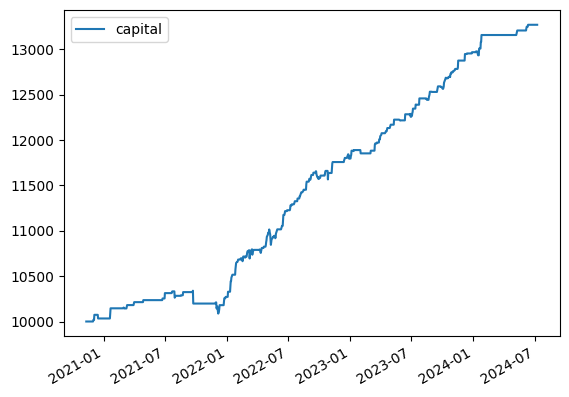

In [263]:
capital.rolling(5).sum().plot.line()
print(capital[-5:].sum())